# Постановка задачи
К вам обратился представитель крупного агентства недвижимости со следующей проблемой:
«Мои риелторы тратят катастрофически много времени на сортировку объявлений и поиск выгодных предложений. Поэтому их скорость реакции, да и, сказать по правде, качество анализа не дотягивают до уровня конкурентов. Это сказывается на наших финансовых показателях.
Ваша задача — разработать модель, которая позволила бы обойти конкурентов по скорости и качеству совершения сделок. Вот датасет для работы».

Что необходимо сделать: разработать сервис для предсказания стоимости домов на основе истории предложений.

In [35]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import re
import json
import category_encoders as ce

from scipy.stats import normaltest

from sklearn.feature_selection import SelectKBest, f_regression
from sklearn.model_selection import train_test_split, RandomizedSearchCV, KFold
from sklearn.linear_model import LinearRegression
from sklearn.ensemble import RandomForestRegressor, GradientBoostingRegressor, AdaBoostRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_absolute_error, mean_absolute_percentage_error, mean_squared_error, r2_score
from sklearn.preprocessing import MinMaxScaler,RobustScaler

from catboost import CatBoostRegressor

pd.set_option('display.max_columns', None)

# фиксируем RANDOM_SEED
RANDOM_SEED = 42
# зафиксируем версию пакетов:
!pip freeze > requirements.txt

In [36]:
def get_graphics(df,feature,mask):
    fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 4))
    # версия для полного датасета
    if len(mask) == 0:
        sns.histplot(
            data=df,
            x=feature,
            bins=25,
            kde=True,
            ax=axes[0]
        );
        sns.boxplot(
            data=df,
            x=feature,
            orient='h',
            width=0.9
        );
    # версия для датасета с фильтрацией
    else:
        sns.histplot(
            data=df[mask],
            x=feature,
            bins=25,
            kde=True,
            ax=axes[0]
        );
        sns.boxplot(
            data=df[mask],
            x=feature,
            orient='h',
            width=0.9
        );


## Часть 1. Знакомство с данными, очистка данных

Описание признаков:
* 'status' - статус продажи
* 'private pool’ и 'PrivatePool' - наличие частного бассейна,
* 'propertyType' - тип недвижимости, поместья, свойства,
* 'street' - адрес дома
* 'baths' - количество ванных комнат   
* 'homeFacts' - сведения о строении дома, содержит несколько отдельных данных, имеющих влияние на оценку недвижимости, дома, квартиры
* 'fireplace' - сведения о наличии камина (ов) в доме
* 'city' - город
* 'schools' - сведения о школах в районе
* 'sqft' - площадь дома в футах
* 'zipcode' - почтовый индекс
* 'beds' - количество спален в доме
* 'state' - государство/штаты
* 'stories' - этажность недвижимости
* 'mls-id' и 'MlsId' - идентификатор MLS (Multiple Listing Service - Служба множественного листинга)
* 'target' - целевой признак, который необходимо спрогнозировать - цена недвижимости

In [37]:
df = pd.read_csv('data/data.csv')
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 377185 entries, 0 to 377184
Data columns (total 18 columns):
 #   Column        Non-Null Count   Dtype 
---  ------        --------------   ----- 
 0   status        337267 non-null  object
 1   private pool  4181 non-null    object
 2   propertyType  342452 non-null  object
 3   street        377183 non-null  object
 4   baths         270847 non-null  object
 5   homeFacts     377185 non-null  object
 6   fireplace     103114 non-null  object
 7   city          377151 non-null  object
 8   schools       377185 non-null  object
 9   sqft          336608 non-null  object
 10  zipcode       377185 non-null  object
 11  beds          285903 non-null  object
 12  state         377185 non-null  object
 13  stories       226469 non-null  object
 14  mls-id        24942 non-null   object
 15  PrivatePool   40311 non-null   object
 16  MlsId         310305 non-null  object
 17  target        374704 non-null  object
dtypes: object(18)
memory usa

Обращаем внимание, что в данных наблюдаются пропуски.

In [38]:
df.describe()

,status,private pool,propertyType,street,baths,homeFacts,fireplace,city,schools,sqft,zipcode,beds,state,stories,mls-id,PrivatePool,MlsId,target
count,337267,4181,342452,377183,270847,377185,103114,377151,377185,336608,377185,285903,377185,226469,24942,40311,310305,374704
unique,159,1,1280,337076,229,321009,1652,2026,297365,25405,4549,1184,39,347,24907,2,232944,43940
top,for sale,Yes,single-family home,Address Not Disclosed,2 Baths,"{'atAGlanceFacts': [{'factValue': '', 'factLab...",yes,Houston,"[{'rating': [], 'data': {'Distance': [], 'Grad...",0,32137,3 Beds,FL,1.0,No MLS#,yes,NO MLS,"$225,000"
freq,156104,4181,92206,672,52466,7174,50356,24442,4204,11854,2141,53459,115449,67454,3,28793,24,1462


Исследуем данные на пропуски

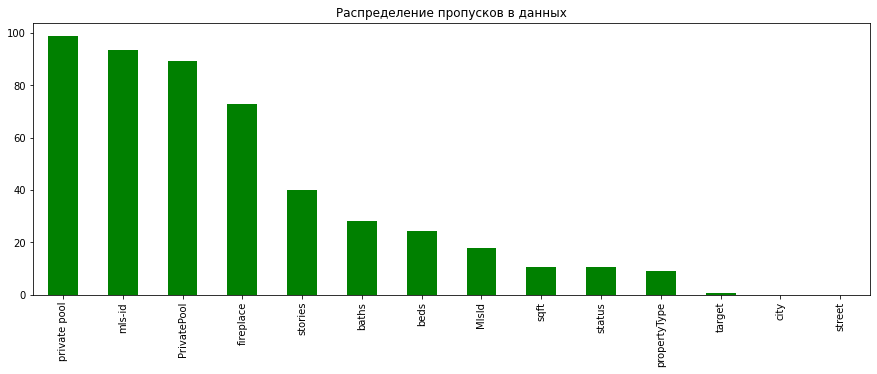

In [39]:
cols_null_percent = df.isnull().mean() * 100

cols_with_null = cols_null_percent[cols_null_percent>0].sort_values(ascending=False)

cols_with_null.plot(
    figsize=(15, 5),
    kind='bar',
    title='Распределение пропусков в данных',
    color='green'
);

Признак mls-id (а заодно и MlsId) будем удалять, т.к. имеет свыше 90% пропусков.
Признаки private pool и PrivatePool хоть и содержат большое количество пропусков, объединим в один признак, а пропуск будем расценивать как отсутствие бассейна.

In [40]:
df.drop(columns=['mls-id','MlsId'], axis=1, inplace=True)

### Обрабатываем признак status

In [41]:
df['status'].value_counts().index.to_list()

['for sale',
 'Active',
 'For sale',
 'foreclosure',
 'New construction',
 'Pending',
 'Pre-foreclosure',
 'Pre-foreclosure / auction',
 'P',
 'Under Contract Show',
 ' / auction',
 'Under Contract   Showing',
 'Active Under Contract',
 'New',
 'Under Contract',
 'Contingent',
 'Price Change',
 'Auction',
 'Foreclosed',
 'A Active',
 'for rent',
 'Foreclosure',
 'recently sold',
 'Under Contract Backups',
 'Contingent Finance And Inspection',
 'Pending Continue To Show',
 'Option Pending',
 'Back on Market',
 'pending',
 'Contingent Show',
 'Pending Taking Backups',
 'Option Contract',
 'Active With Offer',
 'Pending With Contingencies',
 'C',
 'Active Backup',
 'Contract P',
 'Pi',
 'P Pending Sale',
 'Listing Extended',
 'Auction - Active',
 'Due Diligence Period',
 'Contract Contingent On Buyer Sale',
 'Closed',
 'C Continue Show',
 'Pending - Taking Backups',
 'Offer Pending Signature',
 'Active/Contingent',
 'Pending Inspection',
 'Contingent Take Backup',
 'Contingent   Show',
 '

In [42]:
# есть статусы с указанием стоимости, можно их использовать для заполнения пропусков в признаке target
mask_status = (df['status'] == 'Sold: $285,000') | (df['status'] == 'Sold: $15,000')
df[mask_status]

,status,private pool,propertyType,street,baths,homeFacts,fireplace,city,schools,sqft,zipcode,beds,state,stories,PrivatePool,target
212348,"Sold: $285,000",Yes,Single Family,2877 Uranium Ct,Bathrooms: 2,"{'atAGlanceFacts': [{'factValue': '1984', 'fac...",NaN,Redding,"[{'rating': ['6/10', '8/10'], 'data': {'Distan...","Total interior livable area: 1,610 sqft",96003,3 bd,CA,1.0,NaN,NaN
218685,"Sold: $15,000",NaN,Single Family,226 Milton Rd,Bathrooms: 2,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",NaN,Pensacola,"[{'rating': ['2/10', '1/10', '5/10'], 'data': ...","Total interior livable area: 1,248 sqft",32507,3 bd,FL,1.0,NaN,NaN


In [43]:
def get_target_from_status(x):
    x = x.replace("Sold: ","")
    x = x.replace("$","")
    x = x.replace(",","")
    return x

df.loc[mask_status, 'target'] = df['status'][mask_status].apply(get_target_from_status)

In [44]:
#заполняем пропуски
df['status'] = df['status'].fillna('unknown')

In [45]:
def get_status(x):
    #заменяем разделители на пробелы
    x = x.replace("-"," ")
    x = x.replace("/"," ")
    x = x.replace(","," ")
    
    #удаляем задублированные пробелы
    x = " ".join(x.split())
    #приводим к строчному регистру
    x = x.lower()
    
    # боремся с дублированием
    if x in ('p','c','pi','ct','pf','ps'):
        x = 'unknown'
    elif x == 'foreclosed':
        x = 'foreclosure'
    elif x in ('under contract show','under contract showing','active under contract','u under contract'):
        x = 'under contract'
    elif x in ('pending insp finance','pending w insp finance'):
        x = 'pending inspection'
    elif x in ('activated','a active'):
        x = 'active'
    elif x in ('active with contract','active option contract','contingency period','due diligence period'):
        x = 'active option'
    elif x in ('active auction','auction active'):
        x = 'auction'
    elif x == 'pending continue show financing':
        x = 'pending continue show'
    elif x == 'p pending sale':
        x = 'pending sale'
    elif x in ('pending in','pending ab','pending fe'):
        x = 'pending'
    elif x in ('uc continue to show','c continue show'):
        x = 'continue to show'
    elif 'coming soon' in x:
        x = 'coming soon'
    elif 'for rent' in x:
        x = 'for rent'
    return x

In [46]:
df['status'] = df['status'].apply(get_status)

In [47]:
#смотрим что получилось
df['status'].value_counts().head(60)

status
for sale                              199571
active                                105650
unknown                                41492
foreclosure                             7228
new construction                        5475
pending                                 4830
under contract                          3405
pre foreclosure                         2119
pre foreclosure auction                 1560
auction                                 1510
new                                      690
contingent                               581
price change                             563
for rent                                 412
recently sold                            287
under contract backups                   252
contingent finance and inspection        245
pending continue to show                 200
contingent show                          114
back on market                           112
coming soon                              110
option pending                           110
pen

In [48]:
#сокращаем список статусов до 15
popular_status = df['status'].value_counts()[:15].index
df['status'] = df['status'].apply(lambda x: x if x in popular_status else 'other')

### Обрабатываем признак propertyType

* Apartment - апартаменты (в них нельзя прописаться)
* Condo - квартира (кондоминиум)
* Co-Op - совместная (кооперативная квартира)
* Single-Family (Detached, Tiny Home) - односемейный (маленький, отдельный)
* Townhome, Townhouse - таунхауз
* Cape Cod - черепица, деревянный сайдинг, центральная дверь с окнами по бокам, 1-2 этаж.
* Colonial home - два этажа с лишним, симметричный, центральная лестница, формальный вид.
* Contemporary - основные характеристики: Чистые, простые линии; нейтральные цвета; натуральные текстуры
* Cottage - уютная, небольшая веранда; небольшие жилые помещения; индивидуальный характер.
* Craftsman - "ремесленник" элементы ручной работы из дерева, выступающие балки, большие колонны.
* Greek Revival - большие белые колонны, украшения в греческом стиле, парадный вход.
* Farmhouse - деревенское, прямоугольное, большое крыльцо, крыши в стиле сарая и особенности.
* French Country - влияние прованса, каменный внешний вид, состаренный вид.
* Mediterranean - белая штукатурка, теплое дерево и камень, черепичные крыши, есть элементы испанских и итальянских вилл.
* Midcentury Modern - сочетание органики и геометрии, гладкий, лаконичный, большие окна.
* Ranch - один этаж, низкая крыша, открытые жилые помещения, задний двор.
* Split-Level - жилые помещения разделены короткими лестничными пролетами.
* Tudor - деревянный каркас, каменная кладка, ассимметричные, крутые двускатные крыши.
* Victorian (Queen Anne Houses) - два-три этажа, богато украшенные крутые двускатные крыши, небольшие башни, яркие фасады.
* Europian Houses style - часто используют кирпич или камень и включают в себя высокие крутые крыши, высокие окна, часто со ставнями, и традиционные декоративные детали, такие как фронтоны и замковые камни.
* log home - деревянный дом

Некоторые жаргонные сокращения, для исправления дублирования:

* 'manufactured home (house)' = 'mobile' = 'prefab' = 'modular'
* 'mobile' = 'mo2 le' = 'mo2le'
* 'cabin' = 'ca2 n' = 'ca2n'
* midcentury = mid century = mid-century
* single family = single-family home

In [49]:
df['propertyType'].value_counts().index.to_list()

['single-family home',
 'Single Family',
 'Single Family Home',
 'condo',
 'lot/land',
 'Condo',
 'townhouse',
 'Land',
 'multi-family',
 'Condo/Townhome/Row Home/Co-Op',
 'Townhouse',
 'Traditional',
 'coop',
 'Multi Family',
 'High Rise',
 'Ranch',
 'mobile/manufactured',
 'Detached, One Story',
 'Single Detached, Traditional',
 'Contemporary',
 'Multi-Family Home',
 '1 Story',
 'Colonial',
 'Mobile / Manufactured',
 'Contemporary/Modern',
 '2 Stories',
 'Mfd/Mobile Home',
 'Single Detached',
 'Detached, Two Story',
 'Apartment',
 'One Story',
 'Transitional',
 'Cooperative',
 'Florida',
 'Bungalow',
 'Farms/Ranches',
 'apartment',
 'Two Story',
 'Garden Home',
 '2 Story',
 'Cape Cod',
 '2 Stories, Traditional',
 'Spanish/Mediterranean',
 'Other Style',
 '1 Story, Traditional',
 'Other',
 'Condo/Townhome, Traditional',
 'SingleFamilyResidence',
 'Craftsman',
 'Contemporary/Modern, Traditional',
 'Condo/Townhome',
 'Condo/Townhome, Contemporary/Modern',
 'Single Detached, Contemporary

In [50]:
#заполняем пропуски
df['propertyType'] = df['propertyType'].fillna('unknown')

In [51]:
def get_property_type(property_type):
    #приводим к строчному регистру
    property_type = property_type.lower()
    
    #заменяем floors и story на stories
    property_type = property_type.replace("story", "stories")
    property_type = property_type.replace("floors", "stories")
    
    #заменяем цифры на буквы
    property_type = property_type.replace("one","1")
    property_type = property_type.replace("1 1/2", "1.5")
    property_type = property_type.replace("two","2")
    property_type = property_type.replace("2-","2")
    property_type = property_type.replace("three","3")
    
    #удаляем задублированные пробелы
    property_type = ' '.join(property_type.split())
    
    if property_type.strip() == '' or property_type == 'yes':
        return 'unknown'
    
    #объединяем похожие типы
    if property_type in ('mobile','mo2 le','prefab','modular','mfd mobile home','mfd','mobile manufactured','mfd/mobile home'):
        property_type = 'manufactured home (house)'
    elif property_type in ('single family', 'single family home'):
        property_type = 'single-family home'
    elif property_type in ('multi family', 'multi-family'):
        property_type = 'multi-family home'
    elif property_type == 'townhome':
        property_type = 'townhouse'
    elif property_type == 'condominium':
        property_type = 'condo'
    elif property_type == 'ca2 n':
        property_type = 'cabin'
    elif property_type == 'cape cod':
        property_type = 'cape'
    elif property_type in ('mid-century', 'midcentury'):
        property_type = 'mid century'
    elif property_type in ('co-op', 'coop'):
        property_type = 'cooperative'
    elif property_type == 'farmhouse':
        property_type = 'farm house'
    elif property_type == 'other style':
        property_type = 'other'
    return property_type

In [52]:
df['propertyType'] = df['propertyType'].apply(get_property_type)

In [53]:
df['propertyType'].value_counts().head(60)

propertyType
single-family home                          186803
condo                                        42585
unknown                                      34898
lot/land                                     20552
townhouse                                    18400
multi-family home                            12216
land                                         10934
condo/townhome/row home/co-op                 7701
traditional                                   5913
cooperative                                   3838
1 stories                                     1827
high rise                                     1823
ranch                                         1781
mobile/manufactured                           1618
detached, 1 stories                           1614
single detached, traditional                  1581
contemporary                                  1557
2 stories                                     1505
colonial                                      1205
mobile / manufactu

In [54]:
#исключим из датасета земельные участки, т.к. они не входят в поставленную задачу
land_mask = (df['propertyType']=='land') | (df['propertyType']=='lot/land')

print(f'Число земельных участков: {df[land_mask].shape[0]}')
print(f'Число строк в датасете: {df.shape[0]}')

df.drop(df[land_mask].index,  inplace=True)
df = df.reset_index(drop=True)

print(f'Число строк в датасете после удаления: {df.shape[0]}')

Число земельных участков: 31486
Число строк в датасете: 377185
Число строк в датасете после удаления: 345699


In [55]:
# В признаке propertyType есть сведения об этажности домов. Выделим эти данные в отдельный признак
df['PropertyType_Stories'] = df['propertyType'].apply(lambda x: x if 'stories' in x else 'no info')

In [56]:
df['PropertyType_Stories'].value_counts().index.to_list()

['no info',
 '1 stories',
 'detached, 1 stories',
 '2 stories',
 'detached, 2 stories',
 '2 stories, traditional',
 '1 stories, traditional',
 '2 stories, contemporary',
 '1 stories, contemporary',
 'low-rise (1-3 stories)',
 'ranch, 1 stories',
 'detached, ranch, 1 stories',
 'detached, 2 stories, spanish/mediterranean',
 '1 stories with basement',
 'detached, 1 stories, spanish/mediterranean',
 '1 stories, ranch',
 'high-rise (8+ stories)',
 '1 stories, historic/older',
 '2 stories with basement',
 '2 stories, mediterranean',
 '1 stories, spanish/mediterranean',
 '2 stories, spanish/mediterranean',
 'manufactured house, ranch, 1 stories',
 '2 stories, historic/older',
 '2 stories, contemporary, traditional',
 '1 stories, ranch, traditional',
 'mid-rise (4-7 stories)',
 '2 stories, texas hill country',
 'less than 4 stories',
 '2 stories, craftsman',
 '3+ stories',
 '1 stories, mediterranean',
 '1 stories with basement, craftsman',
 '3+ stories, contemporary',
 'manufactured house, ra

In [57]:
# немного преобразований
df['PropertyType_Stories'] = df['PropertyType_Stories'].apply(lambda x: x.replace("less than 4 stories", "low-rise (1-3 stories)"))
df['PropertyType_Stories'] = df['PropertyType_Stories'].apply(lambda x: x.replace("2stories", "2 stories"))

In [58]:
ind_story = df[df['PropertyType_Stories'] != 'no info'].index
df['stories'][ind_story].value_counts()

stories
Multi/Split      26
2                 8
Three Or More     7
1.7               2
1                 2
1 Level           1
Name: count, dtype: int64

In [59]:
# Оставляем сведения об этажности и записываем в stories
def get_stories(x):
    s = x.split(',')
    se = ''
    for i in range(0, len(s)):
        if 'stories' in s[i]:
            se = s[i]
    return se.strip()

df.loc[ind_story, 'stories'] = df['PropertyType_Stories'][ind_story].apply(get_stories)
df['stories'][ind_story].value_counts()

stories
1 stories                    4332
2 stories                    2920
low-rise (1-3 stories)        128
1 stories with basement        99
2 stories with basement        68
3+ stories                     44
high-rise (8+ stories)         38
1.5 stories with basement      21
4+ stories                     17
mid-rise (4-7 stories)         15
1.5 stories                    13
1 stories/ranch                 7
3 stories                       6
mobile home 1 stories           1
coastal 2 stories               1
2.5 stories                     1
2 stories condo                 1
1 stories traditional           1
Name: count, dtype: int64

In [60]:
df.drop('PropertyType_Stories', axis=1, inplace=True)

In [61]:
# Очищаем от слов, относящихся к типам домов
del_str = ['/ranch', 'mobile home', 'coastal', 'traditional', 'condo']

def clear_stories(x):
    for i in range(0, len(del_str)):
        x = x.replace(del_str[i], '').strip()
    return x

df.loc[ind_story, 'stories'] = df['stories'][ind_story].apply(clear_stories)
df['stories'][ind_story].value_counts()

stories
1 stories                    4341
2 stories                    2922
low-rise (1-3 stories)        128
1 stories with basement        99
2 stories with basement        68
3+ stories                     44
high-rise (8+ stories)         38
1.5 stories with basement      21
4+ stories                     17
mid-rise (4-7 stories)         15
1.5 stories                    13
3 stories                       6
2.5 stories                     1
Name: count, dtype: int64

In [62]:
df['propertyType'][ind_story].value_counts().head(60)

propertyType
1 stories                                                  1827
detached, 1 stories                                        1614
2 stories                                                  1505
detached, 2 stories                                         638
2 stories, traditional                                      289
1 stories, traditional                                      237
2 stories, contemporary                                     136
1 stories, contemporary                                      96
low-rise (1-3 stories)                                       90
ranch, 1 stories                                             87
detached, ranch, 1 stories                                   81
detached, 2 stories, spanish/mediterranean                   67
1 stories with basement                                      60
detached, 1 stories, spanish/mediterranean                   53
1 stories, ranch                                             46
high-rise (8+ stories)     

In [63]:
# теперь удаляем этажность из propertyType
def ClearStoriesFromProperty(x):
    s = str(x).split(',')
    for i in range(0, len(s)):
        if 'stories' in s[i]:
            if i == 0:
                if len(s) == 1:
                    s[i] = 'unknown'
                else:
                    s[i] = ''
            if len(s) > 1:
                s[i] = ''   
        x = ''.join(s).strip()
    return x

In [64]:
df.loc[ind_story, 'propertyType'] = df['propertyType'][ind_story].apply(ClearStoriesFromProperty)

In [65]:
df['propertyType'][ind_story].value_counts().head(60)

propertyType
unknown                                           3642
detached                                          2258
traditional                                        541
contemporary                                       266
ranch                                              143
detached spanish/mediterranean                     120
detached ranch                                      86
historic/older                                      57
craftsman                                           57
mediterranean                                       45
spanish/mediterranean                               41
texas hill country                                  28
contemporary traditional                            23
other (see remarks)                                 19
detached patio home                                 19
northwestern contemporary                           17
modern                                              16
ranch traditional                                   

In [66]:
#  Присвоение  полям новых значений с изменением
old = ['cape','log']
new = ['cape cod','log home']

for i in range(0,len(new)):
    df['propertyType'] = df['propertyType'].apply(lambda x: new[i] if old[i] in x else x)

df['propertyType'] = df['propertyType'].apply(lambda x: 'historical' if x in ('historic','historic vintage') else x)

In [67]:
# Присвоение полям новых названий в соответствии с найденной подстрокой
new = ['mediterranean', 'english', 'georgian', 'florida','spanish',
        'lake house', 'tudor', 'victorian', 'ranch', 'townhouse', 
        'single-family','multi-family', 'single detached', 'detached', 
        'high-rise', 'colonial', 'traditional', 'condo', 'contemporary',
        'other style', 'bungalow', 'craftsman', 'cape cod','cooperative',
        'a-frame',  'custom', 'loft', 'multi-level', 'attached', 'manufactured',
        'side-by-side', 'cottage',  'french', 'cluster home', 'garden home', 
        'farmhouse', 'elevated',  'historical', 'transitional','penthouse',
        'modern']

for i in range(0, len(new)):
    df['propertyType'] = df['propertyType'].apply(lambda x: new[i] if new[i] in x else x)

In [68]:
df['propertyType'].value_counts()[:15]

propertyType
single-family    186803
condo             51118
unknown           38540
townhouse         18574
multi-family      12218
traditional        7461
detached           5309
cooperative        3838
manufactured       3515
contemporary       3235
ranch              3101
high rise          1823
colonial           1334
apartment           922
mediterranean       875
Name: count, dtype: int64

In [69]:
# уменьшаем число значений признака
top_Type = df['propertyType'].value_counts()[:15].index
df['propertyType'] = df['propertyType'].apply(lambda x: x if x in top_Type else 'other type')

In [70]:
df['propertyType'].value_counts()

propertyType
single-family    186803
condo             51118
unknown           38540
townhouse         18574
multi-family      12218
traditional        7461
other type         7033
detached           5309
cooperative        3838
manufactured       3515
contemporary       3235
ranch              3101
high rise          1823
colonial           1334
apartment           922
mediterranean       875
Name: count, dtype: int64

### Обрабатываем признак stories

In [71]:
df['stories'].describe()

count     231559
unique       355
top          1.0
freq       66151
Name: stories, dtype: object

In [72]:
df['stories'].value_counts(dropna=False).head(25)

stories
NaN              114140
1.0               66151
2.0               54833
1                 23040
2                 18109
3.0               11157
0.0                7241
One                5758
1 stories          4341
0                  4273
3                  4224
2 stories          2922
9.0                2918
2.00               2777
Two                2495
4.0                2134
2 Story            1970
1 Story            1253
1.00               1201
4                   892
3+                  868
6.0                 718
1.50                650
5.0                 616
Three Or More       562
Name: count, dtype: int64

In [73]:
df['stories'] = df['stories'].fillna('unknown')
df['stories'] = df['stories'].apply(lambda x: x.lower())
df['stories'] = df['stories'].apply(lambda x: '0' if x == '0.0' else x)

In [74]:
df['stories'].value_counts().head(50)

stories
unknown                   114140
1.0                        66151
2.0                        54833
1                          23040
2                          18109
0                          11514
3.0                        11157
one                         5758
1 stories                   4341
3                           4224
2 stories                   3157
9.0                         2918
2.00                        2777
two                         2495
4.0                         2134
2 story                     1970
1 story                     1253
1.00                        1201
4                            892
3+                           868
6.0                          718
1.50                         650
5.0                          616
three or more                562
3.00                         517
9                            468
one story                    395
townhouse                    325
7.0                          312
ranch/1 story                293
6 

In [75]:
#преобразуем строки в числа
num_str = ['one','two','bi', 'split', 'three','tri',
           'four','quad','1 and 1 half', '1 1/2']
num_num = ['1','2','2', '2', '3','3',
           '4','4','1.5','1.5']

for i in range(0, len(num_str)):
    df['stories'] = df['stories'].apply(lambda x: x.replace(num_str[i], num_num[i]))

In [76]:
df['stories'] = df['stories'].apply(lambda x: x.replace('stories', ''))
df['stories'] = df['stories'].apply(lambda x: x.replace('story', ''))
df['stories'] = df['stories'].apply(lambda x: x.replace('level', ''))

In [77]:
df['stories'].value_counts().head(60)

stories
unknown             114140
1.0                  66151
2.0                  54833
1                    28798
2                    20604
0                    11514
3.0                  11157
1                     6279
2                     5294
3                     4224
9.0                   2918
2.00                  2777
4.0                   2134
1.00                  1201
4                      892
3+                     868
6.0                    718
1.50                   650
5.0                    616
3 or more              562
3.00                   517
9                      468
townhouse              325
7.0                    312
ranch/1                293
6                      283
1.5                    255
8.0                    254
2  or more             253
multi/2                245
1.5                    233
3                      233
2.0000                 225
2 , site built         192
5                      189
condominium            172
1 , site built      

In [78]:
df['stories'] = df['stories'].apply(lambda x: x.replace('ranch/',''))
df['stories'] = df['stories'].apply(lambda x: x.replace('multi/',''))
df['stories'] = df['stories'].apply(lambda x: x.replace('with basement',''))
df['stories'] = df['stories'].apply(lambda x: x.replace(' , site built',''))
df['stories'] = df['stories'].apply(lambda x: x.replace('/basement',''))
df['stories'] = df['stories'].apply(lambda x: x.replace('basement',''))


In [79]:
mask_ranch = (df['propertyType'] =='ranch')
df[mask_ranch]['stories'].value_counts()

stories
unknown            1893
1                   796
1                   285
2                    83
2                    17
farm                  6
1.5                   5
3                     4
low-rise (1-3 )       4
4                     2
3+                    2
farm house            1
1.5                   1
contemporary          1
1.000                 1
Name: count, dtype: int64

In [80]:
mask_colonial = (df['propertyType'] =='ranch')
df[mask_colonial]['stories'].value_counts()

stories
unknown            1893
1                   796
1                   285
2                    83
2                    17
farm                  6
1.5                   5
3                     4
low-rise (1-3 )       4
4                     2
3+                    2
farm house            1
1.5                   1
contemporary          1
1.000                 1
Name: count, dtype: int64

In [81]:
mask_ranch = (df['propertyType'] =='ranch') & (df['stories'] == 'unknown')
mask_colonial = (df['propertyType'] =='colonial') & (df['stories'] == 'unknown')

df.loc[mask_ranch, 'stories'] = '1.0'
df.loc[mask_colonial, 'stories'] = '2.0'

In [82]:
df['stories'].value_counts()

stories
unknown                              111108
1.0                                   68044
2.0                                   55972
1                                     28953
2                                     21041
                                      ...  
4.0000                                    1
1.2                                       1
manufactured home, non-site built         1
bedroom - 2 plan                          1
65.0                                      1
Name: count, Length: 315, dtype: int64

In [83]:
def convert_stories(x):
    #if x.startswith(','): x = x[1:]
    if x == 'unknown': return x
    x = re.sub('[^0-9,-\.]', '', x)
    x = re.sub('-',',', x)
    x = x.replace(',,',',0,')
    x = x.split(',')
    try:
        x = (max([float(item) for item in x]))
    except:
        x = x[0]
    return x

df['stories'] = df['stories'].apply(convert_stories)

#df['stories_new'].value_counts().head(60)

In [84]:
df.loc[(df['stories'] == ''), 'stories'] = 0

### Обрабатываем признак baths

In [85]:
df['baths'].value_counts().head(60)

baths
2 Baths         52108
3 Baths         35400
2               20448
2.0             16576
4 Baths         14719
3.0             10869
3               10113
Bathrooms: 2     9538
2.5              8113
Bathrooms: 3     6613
1                6579
1.0              5930
5 Baths          5358
4.0              4593
2.5 Baths        4468
4                3566
3.5              3455
Bathrooms: 1     3234
2 ba             2686
6 Baths          2600
Bathrooms: 4     2384
1,500            2209
3 ba             1893
1.5              1854
3.5 Baths        1819
2,000            1795
1,750            1723
3,000            1686
5.0              1557
2,250            1442
1,000            1280
5                1224
1,250            1208
7 Baths          1205
4.5              1016
2,750             965
2,500             894
Bathrooms: 5      823
~                 782
1 ba              756
6.0               737
4 ba              735
3,500             653
8 Baths           636
-- baths          509
6   

In [86]:
df['baths'] = df['baths'].fillna('0')

In [87]:
def is_num(x):
    try:
        float(x)
        return True
    except ValueError:
        return False

def get_baths(x):
    x = re.sub('ba','Baths', x)
    x = re.sub('1 1/2', '1.5', x)
    x = x.replace('.0', '')
    x = x.replace(',','.')
    x = x.replace('Bathsths','Baths')
    x = x.replace('7,500+','7,500')
    if x == 'Bathrooms: 241': 
        x = '241'# Baths'
    if x == 'Bathrooms: SemiMod': 
        x = '6 Baths'
    if x == 'Sq. Ft. ':
        x = '0'
    if 'rooms' in x:
        x = '0'
    x = x.replace('Bathrooms: ','')
    x = x.replace('+','+ Baths')
    if x == '1 / 1-0 / 1-0 / 1-0' or x=='2-1 / 2-1 / 1-1 / 1-1':  
        x = '2'
    if x == '1 / 1 / 1 / 1' or x=='1-0 / 1-0 / 1' or x=='3-1 / 2-2':  
        x = '3'
    if x == '116 / 116 / 116':
        x = '116'# Baths'
    if x == '0 / 0' or x== '0.00' or x=='0.0' or x=='00' or x=='0 /':
        x = '0'
    if '--' in x or '~' in x or '—' in x:
        x = '0'
    if is_num(x) and float(x) < 120:
        x = x #+ ' Baths'
    x = x.replace('Baths','')
    x = x.replace('Bath','')
    x = x.replace('+','')
    if x == '1-2 ':
        x = '2'
    return x

In [88]:
df['baths'] = df['baths'].apply(get_baths)

In [89]:
df['baths'] = df['baths'].astype(float)

### Обрабатываем признак sqft

In [90]:
df['sqft'].value_counts()

sqft
0                                          948
1,200 sqft                                 814
1,000 sqft                                 639
1,100 sqft                                 566
1,800 sqft                                 556
                                          ... 
24,093 sqft                                  1
153,693 sqft                                 1
4,826 sqft                                   1
7,094 sqft                                   1
Total interior livable area: 4,615 sqft      1
Name: count, Length: 24931, dtype: int64

In [91]:
def get_sqft(sqft):
    if pd.isna(sqft):
        return 0
    sqft = str(sqft).replace("sqft","")
    sqft = sqft.replace("--","0")
    sqft = sqft.replace(",","")
    sqft = sqft.replace("Total interior livable area: ","")
    if sqft == '610-840 ':
        return '840'
    return sqft #то его и возвращаем

df['sqft'] = df['sqft'].apply(get_sqft)

In [92]:
df['sqft'].value_counts().index.to_list()

[0,
 '0',
 '1200 ',
 '1000 ',
 '1100 ',
 '1800 ',
 '1500 ',
 '1400 ',
 '2000 ',
 '1600 ',
 '800 ',
 '1200',
 '1300 ',
 '900 ',
 '1440 ',
 '2400 ',
 '1500',
 '960 ',
 '2200 ',
 '3000 ',
 '1800',
 '2100 ',
 '1344 ',
 '1152 ',
 '1700 ',
 '1120 ',
 '1400',
 '1250 ',
 '1600',
 '850 ',
 '750 ',
 '1100',
 '2500 ',
 '1080 ',
 '1440',
 '1248 ',
 '1056 ',
 '1000',
 '2000',
 '0 ',
 '960',
 '1320 ',
 '700 ',
 '1050 ',
 '1300',
 '1350 ',
 '950 ',
 '2300 ',
 '2400',
 '1900 ',
 '1650 ',
 '1296 ',
 '1260 ',
 '800',
 '1700',
 '1008 ',
 '1450 ',
 '1344',
 '1040 ',
 '1152',
 '1680 ',
 '900',
 '864 ',
 '1280 ',
 '2100',
 '720 ',
 '1120',
 '1170 ',
 '1250',
 '840 ',
 '1248',
 '2600 ',
 '1140 ',
 '1150 ',
 '2200',
 '1680',
 '2700 ',
 '1560 ',
 '1224 ',
 '1920 ',
 '1750 ',
 '1620 ',
 '1512 ',
 '1260',
 '2800 ',
 '1650',
 '1350',
 '1320',
 '1080',
 '1056',
 '1450',
 '2500',
 '1176 ',
 '4000 ',
 '1520 ',
 '1092 ',
 '1900',
 '1850 ',
 '1230 ',
 '1296',
 '1280',
 '1560',
 '850',
 '1216 ',
 '1550 ',
 '1728 ',
 '1

In [93]:
df['sqft'] = df['sqft'].apply(lambda x: '0' if x == '' else x)
df['sqft'] = df['sqft'].astype(float)

### Обрабатываем признак zipcode

In [94]:
# Предположим, что от него стоимость не зависит, поэтому можем удалить.
df.drop('zipcode', axis=1, inplace=True)

### Обрабатываем признак beds

In [95]:
df['beds'].value_counts().index.to_list()

['3 Beds',
 '4 Beds',
 '3',
 '2 Beds',
 '4',
 '2',
 'Baths',
 '3 bd',
 '5 Beds',
 '4 bd',
 '3.0',
 '5',
 '2 bd',
 '4.0',
 '1',
 '6 Beds',
 '5 bd',
 '2.0',
 '6',
 '5.0',
 '0',
 '7 Beds',
 '1 bd',
 '-- bd',
 '8 Beds',
 'Bath',
 '6 bd',
 '7',
 ' ',
 '1.0',
 '9 Beds',
 '8',
 '6.0',
 '10 Beds',
 '7 bd',
 '12 Beds',
 '-- sqft',
 '8 bd',
 '9',
 '5,000 sqft',
 '11 Beds',
 '0.0',
 '7.0',
 '10',
 '1 acre',
 '16 Beds',
 '8.0',
 '0.34 acres',
 '0.28 acres',
 '11',
 '9 bd',
 '12',
 '0.26 acres',
 '0.29 acres',
 '1.03 acres',
 '0.3 acres',
 '0.27 acres',
 '10,001 sqft',
 '13 Beds',
 '2,874 sqft',
 '0.5 acres',
 '14 Beds',
 '0.43 acres',
 '18 Beds',
 '0.46 acres',
 '16',
 '10 bd',
 '6,098 sqft',
 '10,018 sqft',
 '15 Beds',
 '0.37 acres',
 '8,712 sqft',
 '12 bd',
 '0.32 acres',
 '0.35 acres',
 '0.39 acres',
 '7,405 sqft',
 '0.33 acres',
 '0.25 acres',
 '0.31 acres',
 '0.41 acres',
 '24 Beds',
 '0.52 acres',
 '0.47 acres',
 '0.36 acres',
 '0.4 acres',
 '0.53 acres',
 '0.55 acres',
 '5,009 sqft',
 '6,96

In [96]:
df['beds'] = df['beds'].fillna('0')

In [97]:
df['beds'].value_counts().head(60)

beds
0              63596
3 Beds         52432
4 Beds         34981
3              31404
2 Beds         25702
4              20028
2              16109
Baths          15282
3 bd           12877
5 Beds         11145
4 bd            8265
3.0             8087
5               6424
2 bd            5243
4.0             5231
1               4609
6 Beds          3738
5 bd            2633
2.0             2429
6               1806
5.0             1371
7 Beds          1082
1 bd            1081
-- bd           1013
8 Beds           745
Bath             736
6 bd             656
7                510
                 451
1.0              428
9 Beds           340
8                321
6.0              311
10 Beds          173
7 bd             147
12 Beds          129
-- sqft           97
8 bd              97
9                 95
5,000 sqft        92
11 Beds           84
0.0               84
7.0               67
10                66
1 acre            48
16 Beds           41
8.0               41
0.34 acr

In [98]:
def get_beds(x):
    x = x.lower()
    x = x.replace('-- bd','0')
    x = x.replace('bd','')
    x = x.replace('beds','')
    x = x.strip()
    if 'bath' in x:
        x = '1'
    if x == '0' or x == '--' or x == '':
        x = '0'
    if '3 or more bedrooms' in x:
        x = '3' 
    if '2 bedrooms' in x:
        x = '2'
    if 'acre' in x or 'sqft' in x:
        x = '0'
    if "based on" in x:
        x = '0'
    if x == '1-2':
        x = '2'
    x = x.replace('.0','')
    return x.strip()

In [99]:
df['beds'] = df['beds'].apply(get_beds)

In [100]:
df['beds'].value_counts()

beds
3      104802
4       68505
0       68221
2       49484
1       22142
5       21573
6        6511
7        1806
8        1204
9         479
10        271
12        185
11        133
16         70
13         46
14         42
15         32
18         31
24         30
20         20
17         12
32          9
28          9
26          8
22          8
19          6
23          5
21          5
34          5
27          5
30          4
40          4
44          3
36          3
25          3
47          2
42          2
33          2
48          2
78          2
29          2
76          1
35          1
46          1
52          1
99          1
39          1
75          1
53          1
31          1
144         1
88          1
Name: count, dtype: int64

In [101]:
df['beds'] = df['beds'].astype('int')

### Обрабатываем признак state

In [102]:
df['state'].value_counts()

state
FL    102902
TX     78496
NY     24025
CA     22367
NC     18978
TN     15953
WA     12628
OH     11662
IL      8296
NV      7722
CO      6232
GA      5933
PA      4927
MI      4764
DC      4599
AZ      3236
IN      2889
OR      2563
MA      1499
UT      1226
MD      1082
MO       866
VT       722
VA       693
WI       438
NJ       428
IA       212
ME       190
KY        76
OK        30
SC        27
MS        26
DE         5
MT         3
Fl         1
BA         1
OT         1
OS         1
Name: count, dtype: int64

In [103]:
df['state'] = df['state'].apply(lambda x: x.upper())

### Обрабатываем признаки private pool и PrivatePool

In [104]:
df['private pool'] = df['private pool'].apply(lambda x: 0 if pd.isna(x) else 1)
df['PrivatePool'] = df['PrivatePool'].apply(lambda x: 0 if pd.isna(x) else 1)

# создаем признак HasPrivatePool: если хотя бы один из признаков (private pool и PrivatePool) равен 1, то считаем, что есть бассейн
df['HasPrivatePool'] = df['private pool'] | df['PrivatePool']

In [105]:
#проверяем, корректно ли перенесли признаки
mask = (df['HasPrivatePool'] == 1) & (df['private pool'] != 1) & (df['PrivatePool'] != 1)
print(f'Число неправильных записей: {df[mask].shape[0]}')

#удаляем старые признаки private pool и PrivatePool
df.drop(columns=['private pool','PrivatePool'], axis=1, inplace=True)

Число неправильных записей: 0


### Обрабатываем признак street

In [106]:
street_unique_percent = df['street'].nunique() * 100 / df.shape[0]
print(f'Процент уникальных записей от общего числа записей: {round(street_unique_percent)} %')

Процент уникальных записей от общего числа записей: 89 %


Признак содержит почти 90% уникальных значений, удалим его

### Обрабатываем признак fireplace

In [107]:
df['fireplace'].value_counts().index.to_list()

['yes',
 'Yes',
 '1',
 '2',
 'Not Applicable',
 'Fireplace',
 '3',
 'Living Room',
 'LOCATION',
 'Wood Burning',
 'Gas/Gas Logs',
 'Fireplace YN',
 'Special Features',
 '1 Fireplace',
 '0',
 'No',
 'FAMILYRM',
 'Fireplace Features',
 'Great Room',
 'Wood',
 'Gas Logs, Great Room',
 'Ceiling Fan',
 'Living Room, Wood Burning',
 '4',
 'Family Room, Wood Burning',
 'FAMILYRM, Gas Logs',
 'Gas',
 'Gas Logs, In Great Room',
 'Gas Logs',
 'Gas Logs, In Living Room',
 'Family Room',
 'Ceiling Fan, Walk-In Closets',
 'Gas Log, One',
 'Gas Logs, Living Room',
 'Gas Logs, In Den/Family Room',
 'Decorative',
 'One',
 'Gas, Family Room',
 '1 Fireplace, Fireplace Family Rm',
 'Electric',
 '# Fireplaces - Woodburning',
 'Ceiling Fan, Extra Closets, Storage, Walk-In Closets',
 'Den',
 '5',
 'Ceiling Fan, Extra Closets, Storage, Utility Connection, Walk-In Closets',
 '# Fireplaces - Gas',
 'Log Woodburning, One',
 'Gas, Living Room',
 'In Living Room',
 'Gas Fuel,LOCATION',
 'Ceiling Fan, Extra Closet

In [108]:
df['fireplace'] = df['fireplace'].fillna('0') # пропуски будем считать отсутствие камина 
df['fireplace'] = df['fireplace'].apply(lambda x: x.lower()) # нижний регистр

In [109]:
 # Признаки отсутствия камина
no = ['no fireplace', 'no', 'n/k', 'not applicable', 'ceiling fan',
    'smthr', 'smapl', 'number', 'extra closets, walk-in closets',
    'extra closets, smthr, storage, walk-in closets', 'redecorated',
    'other-see remarks', 'air filter, storage, walk-in closets',
    'extra closets, smthr, walk-in closets',
    'smthr, storage, walk-in closets', 'air filter', 'see through',
    'elevator', 'extra closets, smthr', 'storage, wet bar',
    'extra closets, redecorated, storage',
    'fire sprinkler system, smcam, smlt, smthr, storage, walk-in closets',
    'fire sprinkler system, redecorated',
    'central vacuum, elevator, extra closets, walk-in closets, wet bar',
    'water filter', 'air filter, extra closets, smthr, walk-in closets',
    'heating system: yes(s)','water filter, wet bar', 'smcam',
    'central vacuum, elevator, walk-in closets, wet bar',
    'extra closets, fire sprinkler system', 'central vacuum, smthr',
    'extra closets, storage, walk-in closets, water filter, wet bar',
    'redecorated, storage', 'hot tub, redecorated',
    'air filter, dehumidifier, extra closets, redecorated, storage, water filter',
    'fire sprinkler system, smthr', 'extra closets, smcam, smthr',
    'extra closets, storage, walk-in closets, wet bar',
    'extra closets, fire sprinkler system, redecorated',
    'air filter, walk-in closets, water filter, wet bar',
    'central vacuum, elevator, extra closets, hot tub, smthr, wet bar',
    'elevator, fire sprinkler system, storage, walk-in closets',
    'walk-in closets, water filter, wet bar',
    'redecorated, walk-in closets', 'extra closets, smapl',
    'presently inoperative, decorative only', 'other - see remarks',
    'air filter, central vacuum, intercom, walk-in closets',
    'firepit', 'fire pit,gas fuel,location', 'fire pit, location',
    'firepit, wood', 'central vacuum', 'central vacuum, elevator, extra closets, storage, walk-in closets, wet bar',
    'storage, walk-in closets, water filter, wet bar', 'fire pit,see through,location',
    'air filter, central vacuum, elevator, extra closets, redecorated, wet bar',
    'air filter, elevator, extra closets, walk-in closets, wet bar',
    'elevator, walk-in closets',
    'central vacuum, extra closets, smthr, storage, walk-in closets',
    'elevator, extra closets, fire sprinkler system, storage, walk-in closets',
    'air filter, extra closets, storage, walk-in closets',
    'dehumidifier, fire sprinkler system, storage, walk-in closets, water filter']
for i in range(0, len(no)):
    df['fireplace'] = df['fireplace'].apply(lambda x: '0' if x == no[i].strip() else x)

In [110]:
df['fireplace'].value_counts().index.to_list()

['0',
 'yes',
 '1',
 '2',
 'fireplace',
 '3',
 'living room',
 'location',
 'wood burning',
 'gas/gas logs',
 'fireplace yn',
 'special features',
 '1 fireplace',
 'familyrm',
 'fireplace features',
 'great room',
 'wood',
 'gas logs, great room',
 'living room, wood burning',
 '4',
 'family room, wood burning',
 'familyrm, gas logs',
 'gas',
 'gas logs, in great room',
 'gas logs',
 'gas logs, in living room',
 'family room',
 'ceiling fan, walk-in closets',
 'gas log, one',
 'gas logs, living room',
 'gas logs, in den/family room',
 'decorative',
 'one',
 'gas, family room',
 '1 fireplace, fireplace family rm',
 'electric',
 '# fireplaces - woodburning',
 'ceiling fan, extra closets, storage, walk-in closets',
 '5',
 'den',
 'ceiling fan, extra closets, storage, utility connection, walk-in closets',
 '# fireplaces - gas',
 'log woodburning, one',
 'gas, living room',
 'in living room',
 'gas fuel,location',
 'ceiling fan, extra closets, walk-in closets',
 'walk-in closets',
 '1 firep

In [111]:
df['fireplace'] = df['fireplace'].apply(lambda x: '1' if x != '0' else '0')

### Обрабатываем признак city

In [112]:
df['city'].isna().sum()

9

In [113]:
df['city'].value_counts().index.to_list()

['Houston',
 'Miami',
 'San Antonio',
 'Jacksonville',
 'Dallas',
 'Brooklyn',
 'New York',
 'Chicago',
 'Charlotte',
 'Las Vegas',
 'Fort Worth',
 'Fort Lauderdale',
 'Orlando',
 'Austin',
 'Tampa',
 'Washington',
 'Nashville',
 'Cleveland',
 'Philadelphia',
 'Seattle',
 'Los Angeles',
 'Atlanta',
 'Detroit',
 'Kissimmee',
 'Miami Beach',
 'Saint Petersburg',
 'Ocala',
 'Memphis',
 'Raleigh',
 'Indianapolis',
 'Denver',
 'Portland',
 'El Paso',
 'ORLANDO',
 'Durham',
 'Chattanooga',
 'Palm Coast',
 'TAMPA',
 'San Diego',
 'Lakewood',
 'Reno',
 'Cincinnati',
 'Cape Coral',
 'Flushing',
 'Hialeah',
 'PORT CHARLOTTE',
 'Sacramento',
 'Glendale',
 'Hollywood',
 'Fresno',
 'Bronx',
 'Doral',
 'Staten Island',
 'Jamaica',
 'Coral Gables',
 'College Station',
 'Knoxville',
 'Boston',
 'Irvine',
 'Vancouver',
 'ST PETERSBURG',
 'Clarksville',
 'Lauderhill',
 'San Francisco',
 'Davie',
 'West Palm Beach',
 'PUNTA GORDA',
 'Tamarac',
 'Aventura',
 'Sunrise',
 'Wilmington',
 'Richmond',
 'Bonita

In [114]:
df[df['city'] == 'Other']

,status,propertyType,street,baths,homeFacts,fireplace,city,schools,sqft,beds,state,stories,target,HasPrivatePool
18464,active,unknown,7607 Triple Acres,0.00,"{'atAGlanceFacts': [{'factValue': '1982', 'fac...",1,Other,"[{'rating': ['2', '2', '3'], 'data': {'Distanc...",1348.0,0,TX,1.0,"249,000",0
54811,active,unknown,12604 Horseshoe Bay,0.00,"{'atAGlanceFacts': [{'factValue': '2018', 'fac...",1,Other,"[{'rating': ['8', '8', '7', '7'], 'data': {'Di...",2310.0,0,TX,1.0,"399,000",0
72295,active,unknown,34 Trophy Rdg,3.50,"{'atAGlanceFacts': [{'factValue': '2016', 'fac...",1,Other,"[{'rating': ['9', '10', '8'], 'data': {'Distan...",6300.0,1,TX,2.0,"1,695,000",0
92685,active,unknown,2403 Ruth St,1.25,"{'atAGlanceFacts': [{'factValue': '', 'factLab...",0,Other,"[{'rating': ['4', '1', '1'], 'data': {'Distanc...",0.0,1,TX,unknown,"250,000",0
98476,active,unknown,8115 Ventura Blvd,2.50,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",0,Other,"[{'rating': ['7', '6', '6', 'NR'], 'data': {'D...",2599.0,1,TX,1.0,"354,000",0
117621,active,unknown,Undisclosed Address,0.00,"{'atAGlanceFacts': [{'factValue': '2007', 'fac...",0,Other,"[{'rating': ['5', 'NR', '5', 'NR', '2'], 'data...",6024.0,0,TX,2.0,"2,999,500",0
120834,active,unknown,22821 Linwood Rdg,2.25,"{'atAGlanceFacts': [{'factValue': '2018', 'fac...",1,Other,"[{'rating': ['10', '6', '7'], 'data': {'Distan...",4030.0,1,TX,2.0,"1,200,000",0
128447,active,unknown,10163 WESTOVER Blf,0.00,"{'atAGlanceFacts': [{'factValue': '2019', 'fac...",0,Other,"[{'rating': ['6', '5', '3'], 'data': {'Distanc...",2744.0,0,TX,1.0,"385,900",0
157387,active,unknown,14719 Rifleman Rd,0.00,"{'atAGlanceFacts': [{'factValue': '2015', 'fac...",0,Other,"[{'rating': ['7', 'NR', '8', '7'], 'data': {'D...",2262.0,0,TX,1.0,"294,000",0
177367,active,unknown,55 E 1476 Land W,0.00,"{'atAGlanceFacts': [{'factValue': '', 'factLab...",0,Other,"[{'rating': [], 'data': {'Distance': [], 'Grad...",0.0,0,OT,unknown,"50,000",0


In [115]:
df['city'] = df['city'].fillna('other')
df['city'] = df['city'].apply(lambda x: x.lower())

Оставим топ 250 городов, остальным присвоим other

In [116]:
top_city = df['city'].value_counts()[:250].index

df['city'] = df['city'].apply(lambda x: x if x in top_city else 'other')

### Обрабатываем признак homefacts

In [117]:
df['homeFacts'].value_counts()

homeFacts
{'atAGlanceFacts': [{'factValue': '', 'factLabel': 'Year built'}, {'factValue': '', 'factLabel': 'Remodeled year'}, {'factValue': '', 'factLabel': 'Heating'}, {'factValue': '', 'factLabel': 'Cooling'}, {'factValue': '', 'factLabel': 'Parking'}, {'factValue': '—', 'factLabel': 'lotsize'}, {'factValue': None, 'factLabel': 'Price/sqft'}]}                                                             7168
{'atAGlanceFacts': [{'factValue': None, 'factLabel': 'Year built'}, {'factValue': None, 'factLabel': 'Remodeled year'}, {'factValue': None, 'factLabel': 'Heating'}, {'factValue': None, 'factLabel': 'Cooling'}, {'factValue': None, 'factLabel': 'Parking'}, {'factValue': None, 'factLabel': 'lotsize'}, {'factValue': None, 'factLabel': 'Price/sqft'}]}                                                  3532
{'atAGlanceFacts': [{'factValue': '', 'factLabel': 'Year built'}, {'factValue': '', 'factLabel': 'Remodeled year'}, {'factValue': '', 'factLabel': 'Heating'}, {'factValue': '', 'factLa

In [118]:
df['homeFacts'] = df['homeFacts'].apply(lambda x: x.replace('None', '0'))
df['homeFacts'].value_counts()

homeFacts
{'atAGlanceFacts': [{'factValue': '', 'factLabel': 'Year built'}, {'factValue': '', 'factLabel': 'Remodeled year'}, {'factValue': '', 'factLabel': 'Heating'}, {'factValue': '', 'factLabel': 'Cooling'}, {'factValue': '', 'factLabel': 'Parking'}, {'factValue': '—', 'factLabel': 'lotsize'}, {'factValue': 0, 'factLabel': 'Price/sqft'}]}                                                                7168
{'atAGlanceFacts': [{'factValue': 0, 'factLabel': 'Year built'}, {'factValue': 0, 'factLabel': 'Remodeled year'}, {'factValue': 0, 'factLabel': 'Heating'}, {'factValue': 0, 'factLabel': 'Cooling'}, {'factValue': 0, 'factLabel': 'Parking'}, {'factValue': 0, 'factLabel': 'lotsize'}, {'factValue': 0, 'factLabel': 'Price/sqft'}]}                                                                       3532
{'atAGlanceFacts': [{'factValue': '', 'factLabel': 'Year built'}, {'factValue': '', 'factLabel': 'Remodeled year'}, {'factValue': '', 'factLabel': 'Heating'}, {'factValue': '', 'factLa

In [119]:
# Для замены апострофы в словах
change_old = ["Attch'd", "Addtn'l",'"closet"', "Hennen\'s", "Penske's","Req'd"]
change_new = ['Attch`d','Addtn`l','`closet`', 'Hennen`s', 'Penske`s','Req`d']

for i in range(0,len(change_old)):
    df['homeFacts'] = df['homeFacts'].apply(lambda x: x.replace(change_old[i],change_new[i]))

In [120]:
df['homeFacts'] = df['homeFacts'].apply(lambda x: x.replace("'",'"'))

In [121]:
# Для проверки правильности парсинга в json формат
for i in range(0,len(df)):
    ss = df['homeFacts'][i]
    try:
        sa = json.loads(ss)
    except:
        print(i)

def get_homeFacts(x,k):
    js = json.loads(x)
    return js['atAGlanceFacts'][k]['factValue']

In [122]:
df['Year built'] = df['homeFacts'].apply(lambda x: get_homeFacts(x,0))
df['Remodeled year'] = df['homeFacts'].apply(lambda x: get_homeFacts(x,1))
df['Heating'] = df['homeFacts'].apply(lambda x: get_homeFacts(x,2))
df['Cooling'] = df['homeFacts'].apply(lambda x: get_homeFacts(x,3))
df['Parking'] = df['homeFacts'].apply(lambda x: get_homeFacts(x,4))
df['lotsize'] = df['homeFacts'].apply(lambda x: get_homeFacts(x,5))
df['Price/sqft'] = df['homeFacts'].apply(lambda x: get_homeFacts(x,6))

#### Обработка новых признаков из признака homeFacts

##### Признак Year built

In [123]:
df['Year built'].value_counts()

Year built
2019    32052
        31782
2006     7982
2005     7478
2007     7110
        ...  
1780        1
1809        1
1823        1
1807        1
1804        1
Name: count, Length: 229, dtype: int64

In [124]:
df['Year built'] = df['Year built'].apply(lambda x: '0' 
                                    if ((x==0) or (x=='No Data') or (x=='') or len(x)>4) else x)
df['Year built'] = df['Year built'].astype(int)
df['Year built'].value_counts()

Year built
0       36619
2019    32052
2006     7982
2005     7478
2007     7110
        ...  
1780        1
1807        1
1809        1
1823        1
1804        1
Name: count, Length: 226, dtype: int64

In [125]:
df[(df['Year built']>0) & (df['Year built']<1700)]

,status,propertyType,street,baths,homeFacts,fireplace,city,schools,sqft,beds,state,stories,target,HasPrivatePool,Year built,Remodeled year,Heating,Cooling,Parking,lotsize,Price/sqft
137394,other,single-family,648 N Mulberry St,2.0,"{""atAGlanceFacts"": [{""factValue"": ""1208"", ""fac...",0,other,"[{'rating': ['9', '6', '4', '6', 'NR', 'NR'], ...",1208.0,3,OH,unknown,"$79,000",0,1208,,GAS FORCED AIR,,888,0,$65
158316,active,single-family,5532 NW 57th Pl,2.0,"{""atAGlanceFacts"": [{""factValue"": ""1057"", ""fac...",0,ocala,"[{'rating': ['1', '4', '3', '1', '6', '5', 'NR...",1042.0,2,FL,1.0,"$104,900",0,1057,,Central Electric,Central Electric,,8712,$101
242089,active,unknown,576 19th St,0.0,"{""atAGlanceFacts"": [{""factValue"": ""1060"", ""fac...",0,brooklyn,"[{'rating': ['6', '8', '5', '6'], 'data': {'Di...",1892.0,0,NY,unknown,"1,499,999",0,1060,1960,,,,"1,953 Sq. Ft.",$793 / Sq. Ft.
286681,active,other type,Ellisway Rd #13,3.0,"{""atAGlanceFacts"": [{""factValue"": ""1019"", ""fac...",0,charlotte,"[{'rating': [], 'data': {'Distance': [], 'Grad...",1811.0,1,NC,unknown,"285,500",0,1019,,,"Heat Pump for A/C, Heat Pump for Heat",,—,$158 / Sq. Ft.


In [126]:
# Определим индексы "выбросов" в меньшую сторону.
ind_built_old= df[(df['Year built']>0) & (df['Year built']<1700)].index
ind_built_old

Index([137394, 158316, 242089, 286681], dtype='int64')

In [127]:
df['Year built'][ind_built_old]

137394    1208
158316    1057
242089    1060
286681    1019
Name: Year built, dtype: int32

In [128]:
df[df['Year built']>=2023]

,status,propertyType,street,baths,homeFacts,fireplace,city,schools,sqft,beds,state,stories,target,HasPrivatePool,Year built,Remodeled year,Heating,Cooling,Parking,lotsize,Price/sqft
150443,active,traditional,2421 Flume Gate Ct,0.0,"{""atAGlanceFacts"": [{""factValue"": ""2025"", ""fac...",1,raleigh,"[{'rating': ['5', '4', '3'], 'data': {'Distanc...",3518.0,0,NC,unknown,"534,000",0,2025,,,,,—,$152 / Sq. Ft.
287270,active,traditional,2405 Flume Gate Ct,0.0,"{""atAGlanceFacts"": [{""factValue"": ""2025"", ""fac...",1,raleigh,"[{'rating': ['5', '4', '3'], 'data': {'Distanc...",3000.0,0,NC,unknown,"494,990",0,2025,,,,,0.77 Acres,$165 / Sq. Ft.


In [129]:
# Определим индексы "выбросов" в большую сторону.
# Год строительства 2022 год тоже сомнительно!
ind_built_new = df[df['Year built']>=2022].index
ind_built_new

Index([91402, 101415, 118851, 126808, 150443, 164501, 217556, 254499, 287270,
       322794],
      dtype='int64')

In [130]:
plt.rcParams['figure.figsize']=(10,7)

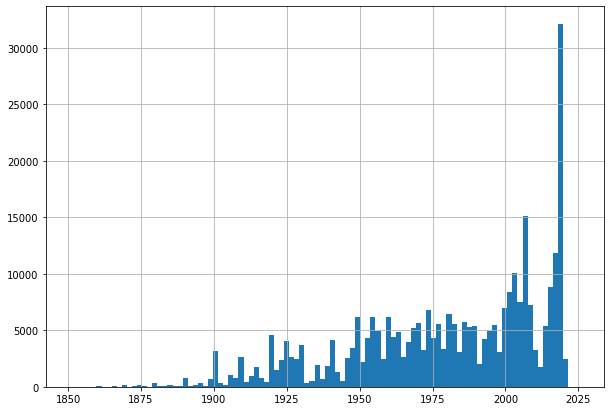

In [131]:
df['Year built'][df['Year built'] >1850].hist(bins=100);

##### Признак Remodeled year

In [132]:
df['Remodeled year'].value_counts()

Remodeled year
        169754
0        26569
2006      5522
2005      4809
2007      4380
         ...  
1853         1
1888         1
1738         1
1869         1
1862         1
Name: count, Length: 152, dtype: int64

In [133]:
df['Remodeled year'] = df['Remodeled year'].apply(lambda x: '0' if (x==0) or (x=='') else x)
df['Remodeled year'] = df['Remodeled year'].astype(int)
df['Remodeled year'].value_counts()

Remodeled year
0       196560
2006      5522
2005      4809
2007      4380
2008      3789
         ...  
1869         1
1853         1
1870         1
1845         1
1862         1
Name: count, Length: 150, dtype: int64

In [134]:
# Определим индексы "выбросов" в меньшую сторону.
ind_Remodeled_old= df[(df['Remodeled year']>0) & (df['Remodeled year']<1700)].index
ind_Remodeled_old
# Определим индексы "выбросов" в большую сторону.
ind_Remodeled_new= df[df['Remodeled year']>=2021].index
ind_Remodeled_new

Index([51188, 77950, 155638, 162693, 326025, 339501], dtype='int64')

In [135]:
df['Remodeled year'][ind_Remodeled_new]

51188     2021
77950     2021
155638    2021
162693    2021
326025    2021
339501    2021
Name: Remodeled year, dtype: int32

<AxesSubplot:>

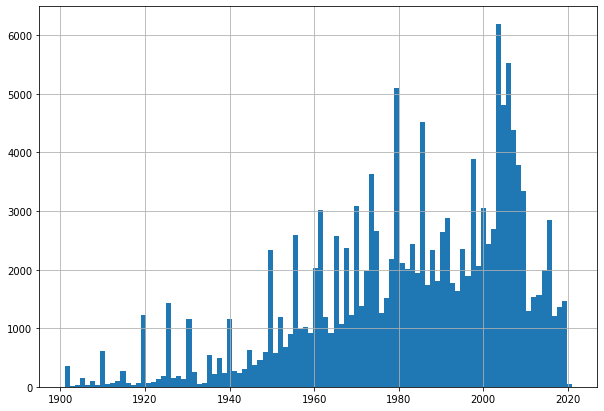

In [136]:
df['Remodeled year'][df['Remodeled year']>1900].hist(bins=100)

In [137]:
df.loc[ind_built_old, 'Year built']

137394    1208
158316    1057
242089    1060
286681    1019
Name: Year built, dtype: int32

Исправлению подлежат данные для индексов ind_built_old признака 'Year built' на ноль, так как остальные данные вполне приемлемы для использования в расчетах. Также можно обнулить для ind_Remodeled_old индексы  признака 'Remodeled year'

In [138]:
df.loc[ind_built_old, 'Year built'] = 0 

df.loc[ind_built_new, 'Year built'] = 2022

df.loc[ind_Remodeled_old, 'lotsize'] = 0

Чтобы полученные большие числа в результате вычитания "не потянули" результат для отсутствующих данных и нулей, поставим -1.0

Данные признаки 'Year built' и 'lotsize' лучше преобразовать в числовой вид, вычитая данные из максимального значения принака. Тогда нулевые значения признака будет иметь какой-то смысл, как возраст недвижимости.

****До определения разности исправим данные, или удалим ненужные строки.

In [139]:
max = df['Year built'].max()
df['Year built'] =  df['Year built'].apply(lambda x: float(max-x) if x!=0 else -1.0)
df['Year built']

0           3.0
1           3.0
2          61.0
3          16.0
4         102.0
          ...  
345694     32.0
345695     98.0
345696     72.0
345697     -1.0
345698      3.0
Name: Year built, Length: 345699, dtype: float64

In [140]:
max = df['Remodeled year'].max()
df['Remodeled year'] =  df['Remodeled year'].apply(lambda x: float(max-x) if x != 0 else -1.0)
df['Remodeled year'].value_counts()

Remodeled year
-1.0      196560
 15.0       5522
 16.0       4809
 14.0       4380
 13.0       3789
           ...  
 152.0         1
 168.0         1
 151.0         1
 176.0         1
 159.0         1
Name: count, Length: 150, dtype: int64

<AxesSubplot:>

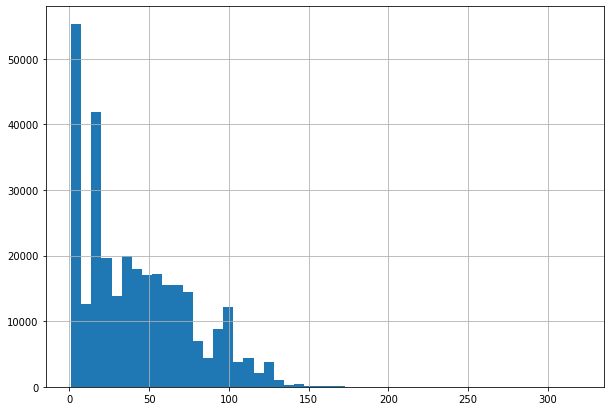

In [141]:
df['Year built'][df['Year built']>0].hist(bins=50)

<AxesSubplot:>

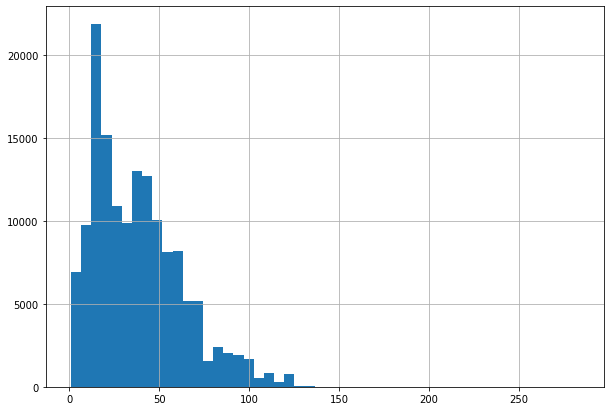

In [142]:
df['Remodeled year'][df['Remodeled year']>0].hist(bins=50)

##### Признак Parking

In [143]:
df['Parking'].value_counts().head(60)

Parking
                                             142299
Attached Garage                               70121
2 spaces                                      28063
1 space                                       14252
No Data                                       13334
Detached Garage                               12925
Carport                                        7569
3 spaces                                       4724
Off Street                                     3586
0                                              3533
0                                              3437
4 spaces                                       2917
1                                              2906
2                                              2727
Carport, Attached Garage                       2700
Off street                                     1657
Attached Garage, Detached Garage               1304
On Street                                      1231
Parking Desc                                    900
Atta

In [144]:
# Признак будет бинарный: 0 - нет паркинг, 1 - есть паркинг.
df['Parking'] = df['Parking'].apply(lambda x: 0 if x==0 or x=='' or x=='No Data' or x=='No' else 1)        
df['Parking'].value_counts()

Parking
1    186524
0    159175
Name: count, dtype: int64

##### Признак lotsize

In [145]:
df['lotsize'].value_counts().index.to_list()

['',
 0,
 '—',
 'No Data',
 '-- sqft lot',
 '0.26 acres',
 '0.28 acres',
 '0.25 acres',
 '0.27 acres',
 '0.29 acres',
 '6,098 sqft',
 '0.34 acres',
 '0.3 acres',
 '7,405 sqft',
 '6,534 sqft',
 '4,356 sqft',
 '0.31 acres',
 '5,227 sqft',
 '10,000 sqft',
 '0.32 acres',
 '5,000 sqft',
 '8,712 sqft',
 '0.33 acres',
 '3,920 sqft',
 '8,276 sqft',
 '0.35 acres',
 '0.36 acres',
 '0.37 acres',
 '0.46 acres',
 '4,792 sqft',
 '9,583 sqft',
 '4,791 sqft',
 '0.4 acres',
 '0.38 acres',
 '1 acre',
 '0.39 acres',
 '7,840 sqft',
 '2,500 sqft',
 '6,969 sqft',
 '10,454 sqft',
 '0.41 acres',
 '3,049 sqft',
 '0.26 Acres',
 '10,019 sqft',
 '7,500 sqft',
 '10,000 Sq. Ft.',
 '6,000 sqft',
 '2,000 sqft',
 '1 Acre',
 '10019',
 '5,662 sqft',
 '0.5 acres',
 '6,970 sqft',
 '5,000 Sq. Ft.',
 '871 sqft',
 '0.44 acres',
 '0.43 acres',
 '0.27 Acres',
 '4,000 sqft',
 '0.42 acres',
 '0.28 Acres',
 '3,485 sqft',
 '7405',
 '7,841 sqft',
 '7,501 sqft',
 '5,663 sqft',
 '0.48 acres',
 '1,742 sqft',
 '5,998 sqft',
 '0.45 acre

In [146]:
# соотношение акра к кв. футу
acre_sf = 43560

In [147]:
df['lotsize'] = df['lotsize'].apply(lambda x: '0' if x==0 or x=='' or x=='No Data' or x=='—' or x=='-- sqft lot' else x)

In [148]:
sqft_str = ['sqft', 'sqft lot']
acr_str = ['Acres', 'acres lot', 'Acre', 'acre', 'acre lot']

def lotsize_convert(x):
    x = x.replace('Sq. Ft.', 'sqft')
    x = x.replace(',','')
    ed_izm = re.sub('[^A-Z a-z]', '', x).strip()
    value = re.sub('[^0-9,\.]', '', x).strip()
    #преобразуем в число
    if ed_izm in acr_str:
        value = round(float(value) * acre_sf, 1)
    if ed_izm in sqft_str  or ed_izm == '':
        value = round(float(value), 1)
    return value

In [149]:
df['lotsize'] = df['lotsize'].apply(lotsize_convert)

In [150]:
df['lotsize'].value_counts()

lotsize
0.0          95095
6098.0        2615
7405.0        2568
0.26          2182
6534.0        2154
             ...  
580.0            1
2153606.4        1
3447.0           1
92351.0          1
2871.0           1
Name: count, Length: 17365, dtype: int64

In [151]:
df['lotsize'] = df['lotsize'].astype('float')

In [152]:
df['lotsize'].describe()

count    3.456990e+05
mean     2.686156e+04
std      2.675924e+06
min      0.000000e+00
25%      0.000000e+00
50%      3.000000e+03
75%      7.500000e+03
max      1.045508e+09
Name: lotsize, dtype: float64

In [153]:
df[df['lotsize']==df['lotsize'].max()]

,status,propertyType,street,baths,homeFacts,fireplace,city,schools,sqft,beds,state,stories,target,HasPrivatePool,Year built,Remodeled year,Heating,Cooling,Parking,lotsize,Price/sqft
144515,for sale,condo,3818 Holland Ave APT 108,0.0,"{""atAGlanceFacts"": [{""factValue"": ""2005"", ""fac...",0,dallas,"[{'rating': ['5/10', '5/10', '2/10'], 'data': ...",1844.0,2,TX,1.0,"$429,900",0,17.0,16.0,Forced air,Central,0,1.045508e+09,$233


In [154]:
# в интернете нашел информацию о площади участка, заменим на правильную площадь
df.loc[(df['lotsize'] > 1e9), 'lotsize'] = 23958

##### Признак Price/sqft

In [155]:
df['Price/sqft'].value_counts()

Price/sqft
0              31083
                5185
No Data         1241
No Info          954
$1/sqft          871
               ...  
$3,087/sqft        1
$3,918/sqft        1
$1,499             1
$1,325/sqft        1
$2,032             1
Name: count, Length: 6417, dtype: int64

In [156]:
df['Price/sqft'].isna().sum()

0

In [157]:
def is_num(x):
    try:
        float(x)
        return True
    except ValueError:
        return False

def get_price_sqft(x):
    if x==0 or x=='' or x=='No Data' or x=='No Info':
        x = '0'
        return float(x)
    x = re.sub('[^0-9\.]', '', x).strip()
    if is_num(x):
        return float(x)
    else:
        return 0.0

In [158]:
df['Price/sqft'] = df['Price/sqft'].apply(get_price_sqft)

In [159]:
df['Price/sqft'].describe()

count    3.456990e+05
mean     3.082370e+02
std      1.541596e+04
min      0.000000e+00
25%      0.000000e+00
50%      1.360000e+02
75%      2.410000e+02
max      5.000000e+06
Name: Price/sqft, dtype: float64

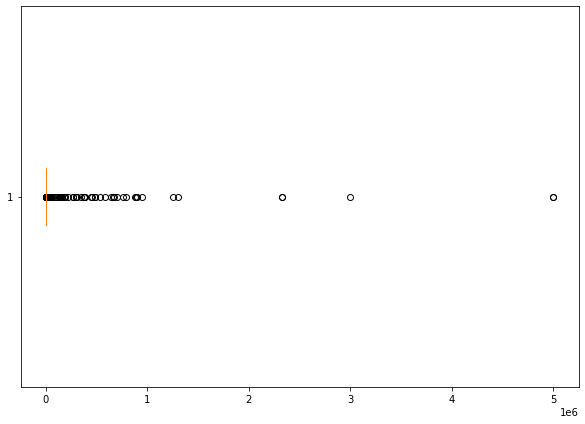

In [160]:
plt.boxplot(df['Price/sqft'], vert=False);

In [161]:
df[['target','Price/sqft']][df['Price/sqft']>40000]

,target,Price/sqft
3454,"$217,700",217700.0
15110,"$1,300,000+",1300000.0
17043,"$480,000",480000.0
29640,"$185,900",185900.0
30991,"$144,900",144900.0
38227,"$790,000",790000.0
41684,"$159,000",159000.0
47510,"$1,275,000",637500.0
57523,"$950,000",950000.0
61298,"$698,000",698000.0


Предельная цена установилась подбором чисел: 20000, 30000, 40000, и т.д.
Цена кв.фута равна всей стоимости недвижимости! Для этих индексов значения признака 'target' поделить на значения признака 'sqft' и ставить в данный признак

In [162]:
ind_Price_sq = df[['target','Price/sqft']][df['Price/sqft']>40000].index
ind_Price_sq

Index([  3454,  15110,  17043,  29640,  30991,  38227,  41684,  47510,  57523,
        61298,  72035,  84134,  85731,  91811, 109694, 121723, 126043, 142035,
       158927, 160755, 164377, 170269, 172308, 172619, 174253, 179403, 180056,
       182092, 182160, 184056, 192990, 196807, 201550, 203208, 222187, 225460,
       239327, 257756, 263376, 268618, 270426, 292072, 302463, 305681, 309599,
       322193, 328000, 332692, 341291],
      dtype='int64')

In [163]:
# Надо пробовать признак target поделить на sqft
df.loc[ind_Price_sq, ['Price/sqft','target', 'sqft']]

,Price/sqft,target,sqft
3454,217700.0,"$217,700",1.0
15110,1300000.0,"$1,300,000+",1.0
17043,480000.0,"$480,000",1.0
29640,185900.0,"$185,900",1.0
30991,144900.0,"$144,900",1.0
38227,790000.0,"$790,000",1.0
41684,159000.0,"$159,000",1.0
47510,637500.0,"$1,275,000",2.0
57523,950000.0,"$950,000",1.0
61298,698000.0,"$698,000",1.0


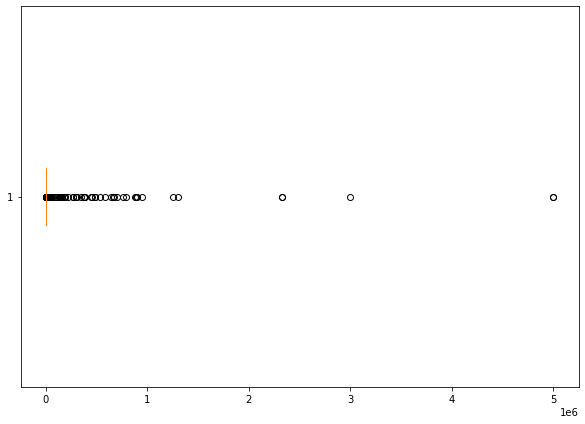

In [165]:
plt.boxplot(df['Price/sqft'], vert=False);

In [166]:
df['Price/sqft'].describe()

count    3.456990e+05
mean     3.082370e+02
std      1.541596e+04
min      0.000000e+00
25%      0.000000e+00
50%      1.360000e+02
75%      2.410000e+02
max      5.000000e+06
Name: Price/sqft, dtype: float64

In [167]:
df['Price/sqft'].value_counts()

Price/sqft
0.0       88839
122.0      1439
123.0      1434
121.0      1430
127.0      1427
          ...  
2875.0        1
2387.0        1
2318.0        1
3067.0        1
1620.0        1
Name: count, Length: 2926, dtype: int64

##### Признаки Heating и Cooling анализируем совместно 

In [168]:
df['Heating'].value_counts()

Heating
Forced Air                                                      81830
                                                                81205
Forced air                                                      51506
Other                                                           28614
No Data                                                          8611
                                                                ...  
Natural Gas, Space Heater                                           1
Exhaust Fans                                                        1
Central, Exhaust Fans, Natural Gas, Zoned                           1
BR Closet-Electric - new                                            1
Baseboard, Hot Water, Programmable Thermostat, Radiant Floor        1
Name: count, Length: 1985, dtype: int64

In [169]:
df['Cooling'].value_counts()

Cooling
Central                                                                157500
                                                                        90610
Central Air                                                             14384
No Data                                                                 10616
Has Cooling                                                              9730
                                                                        ...  
Central Gas, Propane, Zoned                                                 1
Other (See Remarks), Panel/Floor/Wall, Window Unit                          1
Multi Units, Zoned Cooling                                                  1
Central Air, g-Energy Star HVAC, Gas Hot Air/Furnace, Multizone A/C         1
Central A/C (Gas), Central Heat (Gas), Heat Pump                            1
Name: count, Length: 1446, dtype: int64

  Признаки Heating и Cooling существенно влияют на цену недвижимости. Поэтому необходимо привести данные этих показателей в пригодную форму для использования в моделях прогноза цен на недвижимость.

In [170]:
# Функция для первоначального парсинга признаков 'Heating' и 'Cooling' 
patterns = "[!#$%&()'*+.:;<=>?@[\]^_`{|}~—\"]+"

def convert_heat_cool (x):
    if x == 0 or x == '0' or x == '' or x == 'No Data':
        x = 'No'
    x = x.title()
    x = re.sub(patterns, ' ', x)
    if len(x) > 0 and x[0] == ',':
        x = x[1:].strip()
    return x

In [171]:
df['Heating'] = df['Heating'].apply(convert_heat_cool)

Беглый просмотр содержимого признаков 'Heating' и 'Cooling' показывает, что в признаке 'Cooling' приведены  тепловые показатели , а в признаке 'Heating' приведены показатели охлаждения.
Вначале исправим некоторые имеющиеся явно заметные неточности.

In [172]:
# 'Central Air'
#  Выделение индексов строк 
ind_H = df[df['Heating']=='Central Air'].index
df['Cooling'][ind_H].value_counts()

Cooling
Has Cooling    7800
                 14
Name: count, dtype: int64

In [173]:
# Изменение 'Has Cooling' признака 'Cooling' на 'Central Air' признака 'Heating'.
df.loc[ind_H,'Cooling'] = df['Heating'][ind_H]

In [174]:
df['Cooling'][ind_H].value_counts()

Cooling
Central Air    7814
Name: count, dtype: int64

In [175]:
# Выделение индексов строк
ind_C =df[df['Cooling']=='Central Heating'].index
df['Heating'][ind_C].value_counts()

Heating
Electric Heat                                           1470
Natural Gas Heat                                        1134
Central Cooling                                           71
Electric Heat, Natural Gas Heat                           67
Ceiling Fan, Central Cooling                              25
Other Heating Fuel  See Remarks                           16
Propane  Owned                                             5
Electric Heat, Propane  Owned                              2
Electric Heat, Solar Heat                                  2
Ceiling Fan, Central Cooling, Electric Cooling             2
Central Cooling, Wall-Window A/C                           2
Electric Cooling                                           2
Wall-Window A/C                                            1
Natural Gas Heat, Solar Heat                               1
Central Cooling, Zoned Cooling                             1
Ceiling Fan, Electric Cooling                              1
Ceiling Fan     

In [176]:
# Изменение  признака 'Heating' и  признака 'Cooling'.'Central Heating'
def get_heating(x):
    if 'Gas' in x:
        x = 'Central Heating Gas'
    if 'Electric ' in x:
        x = 'Central Heating Electric '
    return x

In [177]:
df.loc[ind_C, 'Heating'] = df['Heating'][ind_C].apply(get_heating)
df['Heating'][ind_C].value_counts()

Heating
Central Heating Electric                                1479
Central Heating Gas                                     1202
Central Cooling                                           71
Ceiling Fan, Central Cooling                              25
Other Heating Fuel  See Remarks                           16
Propane  Owned                                             5
Central Cooling, Wall-Window A/C                           2
Attic Fan, Ceiling Fan, Central Cooling                    1
Ceiling Fan, Central Cooling, Zoned Cooling                1
Central Building Cooling, Central Individual Cooling       1
Ceiling Fan                                                1
Wall-Window A/C                                            1
Central Cooling, Zoned Cooling                             1
Central Building Cooling                                   1
Name: count, dtype: int64

In [178]:
df.loc[ind_C,'Cooling']= 'Central'
df['Cooling'][ind_C].value_counts()

Cooling
Central    2807
Name: count, dtype: int64

In [179]:
ind_CE = df[df['Cooling']=='Electric Heating'].index
df['Heating'][ind_CE].value_counts()

Heating
Refrigeration                                                                                   171
Refrigeration, Ceiling Fan S                                                                    144
Refrigeration, Ceiling Fan S , Programmable Thermostat                                           23
No                                                                                                9
Electric Cooling                                                                                  6
Refrigeration, Programmable Thermostat                                                            5
Central Cooling                                                                                   5
1 Window/Wall Air Conditioning Unit                                                               3
Programmable Thermostat                                                                           3
1 Air Conditioner                                                                           

Содержимое признака Heating выделенных строк больше похоже на данные признака 'Cooling'. Поэтому поменяем их между собой.

In [180]:
df.loc[ind_CE, 'Cooling'] = df['Heating'][ind_CE]

In [181]:
df.loc[ind_CE, 'Heating'] = 'Electric Heating'

In [182]:
df['Heating'][ind_CE].value_counts()

Heating
Electric Heating    398
Name: count, dtype: int64

In [183]:
df['Cooling'][ind_CE].value_counts()

Cooling
Refrigeration                                                                                   171
Refrigeration, Ceiling Fan S                                                                    144
Refrigeration, Ceiling Fan S , Programmable Thermostat                                           23
No                                                                                                9
Electric Cooling                                                                                  6
Refrigeration, Programmable Thermostat                                                            5
Central Cooling                                                                                   5
1 Window/Wall Air Conditioning Unit                                                               3
Programmable Thermostat                                                                           3
1 Air Conditioner                                                                           

В дальнейшем содежимые этих признаков анализируются более подробно, и по мере возможности, очищаются, и данные приводятся к приемлемый вид для использования в моделях.

Признак Heating отдельно

In [184]:
df['Heating'].value_counts().head(60)

Heating
Forced Air                              133336
No                                       93412
Other                                    28614
Heat Pump                                 8776
Central Air                               7814
Gas                                       7424
Electric                                  7417
Central Electric                          7112
Central                                   6247
Central, Electric                         4253
Baseboard                                 3752
Wall                                      3224
Heating System                            2708
Forced Air, Heat Pump                     1767
Electric Heat                             1594
Central Heating Electric                  1479
Radiant                                   1476
Central Air, Ceiling Fan S                1432
Central Heating Gas                       1202
Central Furnace                           1036
Forced Air, Gas                            962
Gas H

In [185]:
ac_str =['Air Conditioning','Air Conditionings','Air Conditioner','Air Conditioners','A/C','Ac']
   
def change_heating(x):
    x = str(x)
    if ('Forced Air' in x or 'Heat Pump' in x) and 'Gas' in x:
        x = 'Forced Gas'
    if ('Forced Air' in x or 'Heat Pump' in x) and 'Electric' in x:
        x = 'Forced Electric'
    if 'Heat Pump' in x or x == 'Forcedair':
        x = 'Forced'
    if 'Forced Air' in x or x == 'Forced Warm Air':
        x = 'Forced'
    for i in range(0, len(ac_str)):
        x = x.replace(ac_str[i], '')
    if 'Central Air' in x:
        x='Central'
    if 'Central' in x and 'Electric' in x:
        x='Central Electric'
    if 'Central' in x and 'Gas' in x:
        x='Central Gas'
    if x == 'Electric':
        x = 'Central Electric'
    return x

df['Heating'] = df['Heating'].apply(change_heating)

In [186]:
df['Heating'].value_counts().index.tolist()

['Forced',
 'No',
 'Other',
 'Central Electric',
 'Central',
 'Gas',
 'Baseboard',
 'Wall',
 'Heating System',
 'Central Gas',
 'Forced Gas',
 'Electric Heat',
 'Radiant',
 'Forced Electric',
 'Central Furnace',
 'Gas Hot Air/Furnace',
 'Gas Heat',
 'Central Heating',
 'Central ',
 'Electric Heating',
 'Electric, Gas',
 'Natural Gas Heat',
 'Natural Gas',
 'Oil',
 'Gas Hot Air/Furnace, Multizone Heat',
 'Wall/Window Unit S ',
 'Window Units',
 'Electric Hot Air',
 'Wall Heater',
 'Radiator',
 'Baseboard, Hot Water',
 'Refrigeration, Ceiling Fan S ',
 'Hot Water/Steam',
 'Wall Furnace',
 'Refrigeration',
 'Gas Hot Air/Furnace, Natural Gas',
 'Central Cooling',
 'Stove',
 'Propane',
 'Hot Water',
 'Hot Air',
 'Central, Zoned',
 'Has Heating',
 'Baseboard, Radiant',
 'Multizone Heat',
 'No Cooling/Vent',
 'Gas Hot Air/Furnace, Multizone Heat, Natural Gas',
 'Gas Gas',
 'Window Unit S ',
 'Central Heat',
 'Closet-Electric',
 'Wall Units / Window Unit',
 'Electric Electric',
 'Heating',
 'G

In [187]:
gas = ['Gas', 'Forced Gas', 'Central Gas', 'Electric, Gas']
central = ['Central Electric', 'Central Gas', 'Central Furnace', 'Central Heating']
electric = ['Central Electric', 'Forced Electric', 'Electric, Gas'] 
name_change = ['Wall', 'Refrigeration', 'Baseboard', 'Hot Water', 'Stove', 'Radiator']

def extra_change_heating(x):
    x = x.strip()
    x = x.replace('Units', 'Unit')
    x = x.replace('Unit S', 'Unit')
    if (('Gas' in x or 'Propane' in x) and (x not in gas)):
        x = 'Gas'
    if ('Central' in x and (x not in central)):
        x = 'Central'
    if ('Electric' in x and (x not in electric)):
        x = 'Electric'
    for i in range(0, len(name_change)):
        if name_change[i] in x:
            x = name_change[i]
    if 'Heat' in x and 'Heating' not in x:
        x = 'Heating'
    if 'Heating' in x and (x not in ['Central Heating', 'Heating System']):
        x = 'Heating'
    if 'Window Unit' in x or x == 'Window':
        x = 'Window Unit'
    if 'Hot Air' in x:
        x = 'Forced'
    if x == '':
        x = 'No data'
    return x

df['Heating'] = df['Heating'].apply(extra_change_heating)

In [188]:
df['Heating'].value_counts().index.tolist()

['Forced',
 'No',
 'Other',
 'Central Electric',
 'Central',
 'Gas',
 'Baseboard',
 'Wall',
 'Electric',
 'Heating System',
 'Central Gas',
 'Forced Gas',
 'Radiant',
 'Forced Electric',
 'Central Furnace',
 'Central Heating',
 'Heating',
 'Electric, Gas',
 'Hot Water',
 'Refrigeration',
 'Oil',
 'Window Unit',
 'Radiator',
 'Stove',
 'No Cooling/Vent',
 'Other Cooling',
 'Floor Furnace',
 'Yes',
 'Contact Manager',
 'Zoned',
 '1',
 'Has',
 'Garage-Tankless',
 'Dual',
 'No Cooling/Vent, Other Cooling',
 'Geothermal',
 'Other, Radiant',
 'Oil, Wood',
 'Steam',
 'Solar',
 '2 s',
 'Gravity',
 'Basement',
 'Combination',
 'Other   See Remarks',
 '3 s',
 'Tankless',
 'Wood',
 '4 s',
 'Reverse Cycle',
 '1 Unit',
 'Other  See Remarks',
 'Incentive',
 'Other Cooling  See Remarks',
 'Two Or More Unit',
 'G-Geothermal',
 'Fireplace',
 'Basement-Boiler',
 'Garage',
 'Multi Zone, Radiant',
 'Fireplace S',
 'Other Cooling, Zoned',
 'Dual Zone Hvac',
 'Fireplace, Floor Furnace',
 '2 Or  More Unit',


Данные признака Heating оказались слишком разнообразными. Требовалось детально изучать данные по строкам. Данные по возможности приведены к удобному виду для категоризации данных.  
Все остальные значения после значения 'Stove' отнесем к 'Other'

In [189]:
ind_Heat = df['Heating'].value_counts()[:'Stove'].index
ind_Heat

df['Heating'] = df['Heating'].apply(lambda x: x if x in ind_Heat else 'other')

Признак Cooling отдельно

In [190]:
df['Cooling'].value_counts()

Cooling
Central                                                                             160307
                                                                                     90596
Central Air                                                                          22198
No Data                                                                              10616
0                                                                                     7095
                                                                                     ...  
Ductless/Mini-Split System, Gas (Hot Air), Heat Pump for A/C, Heat Pump for Heat         1
Other,                                                                                   1
Central Air, Gas (Hot Air), Window Unit                                                  1
Air Conditioning-Room, Evaporative Cooler (Swamp)                                        1
Central A/C (Gas), Central Heat (Gas), Heat Pump                                  

In [191]:
df['Cooling'] = df['Cooling'].apply(convert_heat_cool)

In [192]:
fnd =['Air Conditioning','Air Conditionings','Air Conditioner','Air Conditioners','A/C','Ac']
name_change = ['Central Air','Hot Air','Window Unit','Refrigeration','Air Purification System',
               'Common Heating/Cooling', 'Zoned','Baseboard','Wall','Other','No']

def extra_cooling(x):
    x = x.strip()
    x = x.replace('Fan S', 'Fan')
    x = x.replace('Unit S', 'Unit')
    for i in range(0, len(fnd)):
        x = x.replace(fnd[i], 'Air Conditioning')
    if 'Air Conditioning' in x:
        x = 'Air Conditioning'
    if 'Central' in x and 'Air' not in x:
        x='Central Air'
    for i in range(0, len(name_change)):
        if name_change[i] in x:
            x = name_change[i]
    if 'Central' in x and 'Electric' in x:
        x = 'Central Electric'
    if 'Central' in x and 'Gas' in x:
        x='Central Gas'
    if x == 'Electric':
        x = 'Central Electric'
    if 'Heat Pump' in x or 'Forced Air' in x:
        x = 'Forced Air'
    if 'Window' in x and 'Unit' not in x:
        x = 'Window Unit'
    if 'Ceiling' in x:
        x = 'Ceiling Fan'
    if 'Air Purification System' in x:    
        x = 'Air Purification System'
    if 'Evaporative' in x:    
        x = 'Evaporative Cooling'
    return x

In [193]:
df['Cooling'] = df['Cooling'].apply(extra_cooling)

In [194]:
df['Cooling'].value_counts()

Cooling
Central Air                                                           202211
No                                                                    111983
Air Conditioning                                                       10159
Wall                                                                    4476
Refrigeration                                                           2944
                                                                       ...  
Humidity Control, Mini-Split Unit                                          1
90  High Efficiency, Hepa Air Filtration, Hot Water Recirc Pump            1
Boiler                                                                     1
Ductless/Mini-Split System                                                 1
90  High Efficiency, Ductless Hp-Mini Split, Tankless Water Heater         1
Name: count, Length: 164, dtype: int64

Все остальные значения после  с признака 'Zoned' отнесем к 'Other'
Непонятно, почему-то в признаке 'Cooling' данные чаще всего описывают о теплоснабжении!?
Предполагается,что некоторые установки для тепла также используются для охлаждения.
Данные приведены к удобному виду для категоризации данных, по возможности.

In [195]:
ind_Cool = df['Cooling'].value_counts()['Zoned':].index
ind_Cool

Index(['Zoned', 'Yes', 'Ductless Hp-Mini Split', '1', 'Geothermal',
       '2 Or More Units, Electric', 'Contact Manager', 'Natural Gas Heat',
       'Radiant Heat', 'Attic Fan',
       ...
       'Dual', 'Dehumidifier',
       'Radiant Heat, Radiator Heat, Tankless Water Heater',
       'Hot Water, Radiator Heat, Stove Heat',
       'Energy Star Cooling System, Programmable Thermostat Cooling',
       'Humidity Control, Mini-Split Unit',
       '90  High Efficiency, Hepa Air Filtration, Hot Water Recirc Pump',
       'Boiler', 'Ductless/Mini-Split System',
       '90  High Efficiency, Ductless Hp-Mini Split, Tankless Water Heater'],
      dtype='object', name='Cooling', length=145)

In [196]:
df['Cooling'] = df['Cooling'].apply(lambda x: x if x in ind_Cool else 'Other')

In [197]:
df['Cooling'].value_counts()['Zoned':].sum()

1004

In [198]:
df['Cooling'].value_counts()['Other']

344695

### Обрабатываем признак schools

In [199]:
df['schools'].value_counts()

schools
[{'rating': [], 'data': {'Distance': [], 'Grades': []}, 'name': []}]                                                                                                                                                                                                                                                                                                                                                                                                                                     3097
[{'rating': ['4/10', '5/10', '6/10'], 'data': {'Distance': ['39.69mi', '39.69mi', '39.69mi'], 'Grades': ['9-12', '6-8', 'PK-5']}, 'name': ['Fort Hancock High School', 'Fort Hancock Middle School', 'Benito Martinez Elementary School']}]                                                                                                                                                                                                                                                               216
[{'r

In [200]:
df['schools'] = df['schools'].apply(lambda x: x.replace('None', '0'))

In [201]:
old = ["O\'", " O`,",  "'s", "\'Duke\'", "B\'Nai", "B\'inai",  "L\'Ouver", "L\'ouver",  "L\'Banos", "L\'Dovid", 
              "Lil\'", "D\'",  "d\'Evelyn", "Q\'", "Loggers\'", "Teach N\'",  "K\'Tana", "R&D`",  "Citizens\'",  "Kids\'", 
              "Girls\' ", "d\'Chassidei", "d\'Gur", "d\'Rav", "Pe\'Er", "Be\'Er", "Kids \'R\' Kids", "\'joe\' ", 
              "Meadow\'S", "Sheriff\'S", "Friends\' ", "\'Mother\'", "Int\'L", "\'buddy\'"]
new = ['O`',  " O\', ", '`s', '`Duke`', 'B`Nai', 'B`inai',  'L`Ouver', 'L`Ouver', 'L`Banos', 'L`Dovid', 
              'Lil`', 'D`', 'd`Evelyn', 'Q`', 'Loggers`', 'Teach N`', 'K`Tana', "R&D\'",   'Citizens`', 'Kids`', 
              'Girls` ',  'd`Chassidei','d`Gur', 'd`Rav', 'Pe`Er', 'Be`Er', 'Kids `R` Kids', '`joe` ', 
              'Meadow`S', 'Sheriff`S', 'Friends` ', '`Mother`', 'Int`L', '`buddy`']

In [202]:
for i in range(0,len(old)):
    df['schools'] = df['schools'].apply(lambda x: x.replace(old[i], new[i]))

df['schools'] = df['schools'].apply(lambda x: x.replace("'",'"'))

In [203]:
# Проверка после преобразования отдельных строк с неправильными данными
ss = df['schools'].loc[1485]
sa = json.loads(ss)
sa

[{'rating': ['3', '5', '6', '2', '4', '3'],
  'data': {'Distance': ['5.0 mi',
    '4.8 mi',
    '5.1 mi',
    '6.2 mi',
    '7.6 mi',
    '8.3 mi'],
   'Grades': ['PK–5', '6–8', '9–12', 'PK–5', '5–8', '9–12']},
  'name': ['Hammett Bowen Jr. Elementary School',
   'Liberty Middle School',
   'West Port High School',
   'Marion Oaks Elementary School',
   'Horizon Academy At Marion Oaks School',
   'Francis Marion Military Academy School']}]

In [204]:
# Для проверки правильности парсинга признака 'schools' в json формат
for i in range(0,len(df)):
    ss = df['schools'].loc[i][1:len(df['schools'][i])-1]
    try:
        sa = json.loads(ss)
    except:
        print(i)

#### Обработка новых признаков из признака schools

In [205]:
def app_schools(x,k):
    js = json.loads(x[1:len(x)-1])
    if k==0:
        return js['rating']
    if k==1:
        return js['data']['Distance']
    if k==2:
        return js['data']['Grades']
    if k==3:
        return js['name']

In [206]:
df['schools_rating'] = df['schools'].apply(lambda x: app_schools(x,0))
df['schools_Distance'] = df['schools'].apply(lambda x: app_schools(x,1))
df['schools_Grades'] = df['schools'].apply(lambda x: app_schools(x,2))
df['schools_name'] = df['schools'].apply(lambda x: app_schools(x,3))

##### Сперва посчитаем количества школ и создаем отдельный признак school_count

In [207]:
df['school_count'] = df['schools_rating'].apply(lambda x: len(x))

In [208]:
df['school_count'].value_counts()

school_count
3     194642
8      34491
2      33750
5      28287
4      21017
6       9127
1       7547
7       5351
0       3097
24      1716
13      1031
63       761
10       751
12       719
11       632
9        535
15       506
14       404
22       398
65       346
49       257
16       121
61       110
21        96
17         5
19         2
Name: count, dtype: int64

##### Признак schools_rating

In [209]:
# Вычисляется средний рейтинг школ
df['schools_rating']

0         [4, 4, 7, NR, 4, 7, NR, NR]
1                  [4/10, 0/10, 4/10]
2                  [8/10, 4/10, 8/10]
3           [9/10, 9/10, 10/10, 9/10]
4                                  []
                     ...             
345694                  [10/10, 5/10]
345695             [1/10, 5/10, 7/10]
345696                   [5/10, 4/10]
345697                   [NA, NA, NA]
345698             [5/10, 4/10, 3/10]
Name: schools_rating, Length: 345699, dtype: object

In [210]:
def rait_ch(x):
    count = len(x)
    c = 0
    s = 0
    for i in range(0, len(x)):
        x[i] = x[i].replace('/10', '')
        if x[i].isdigit():
            s += int(x[i])
            c += 1
    if c != 0:
        s = round(s/c, 2)
    else:
        s = 0
    return s

In [211]:
df['schools_rating'] = df['schools_rating'].apply(rait_ch)

In [212]:
df['schools_rating'].value_counts()

schools_rating
6.00    20673
4.00    18819
5.00    18180
3.00    16648
6.33    15047
        ...  
5.88        1
5.44        1
1.44        1
1.90        1
3.93        1
Name: count, Length: 232, dtype: int64

##### Признак schools_Distance

In [213]:
# Вычисляется среднее расстояние до школ
df['schools_Distance']

0         [2.7 mi, 3.6 mi, 5.1 mi, 4.0 mi, 10.5 mi, 12.6...
1                                  [1.65mi, 1.32mi, 1.01mi]
2                                  [1.19mi, 2.06mi, 2.63mi]
3                           [1.05mi, 0.1mi, 1.05mi, 0.81mi]
4                                                        []
                                ...                        
345694                                    [32.1 mi, 1.1 mi]
345695                             [10.61mi, 1.42mi, 0.4mi]
345696                                     [0.48mi, 0.73mi]
345697                             [1.3 mi, 0.5 mi, 1.9 mi]
345698                             [0.3 mi, 1.1 mi, 4.1 mi]
Name: schools_Distance, Length: 345699, dtype: object

In [214]:
def dist_ch(x):
    print(x)
    count = len(x)
    c = 0
    s = 0
    for i in range(0, len(x)):
        x[i] = x[i].replace('mi','')
        if float(x[i]):
            s += float(x[i])
            c += 1
    if c != 0:
        s = round(s/c, 2)
    else:
        s = 0
    return s

In [215]:
df['schools_Distance'] = df['schools_Distance'].apply(dist_ch)

['2.7 mi', '3.6 mi', '5.1 mi', '4.0 mi', '10.5 mi', '12.6 mi', '2.7 mi', '3.1 mi']
['1.65mi', '1.32mi', '1.01mi']
['1.19mi', '2.06mi', '2.63mi']
['1.05mi', '0.1mi', '1.05mi', '0.81mi']
[]
['0.8 mi', '8.3 mi', '4.2 mi', '2.0 mi']
['0.7 mi', '0.4 mi', '2.2 mi']
['5.6 mi', '5.6 mi', '6.8 mi', '6.5 mi', '6.8 mi', '6.8 mi']
['0.7 mi', '0.6 mi', '1.9 mi']
['0.3mi', '1.88mi', '2.37mi']
['0.4 mi', '0.4 mi', '3.0 mi', '3.2 mi', '7.4 mi']
['2.66mi', '0.92mi', '2.54mi']
['1.2 mi', '1.1 mi', '1 mi']
['0.7 mi', '0.6 mi', '2.9 mi']
['0.2 mi', '0.2 mi', '1.5 mi']
['0.5 mi', '0.7 mi', '0.5 mi', '1.1 mi']
['0.3 mi', '0.1 mi', '0.7 mi', '0.9 mi']
['2.09mi', '1.78mi']
['0.19mi', '0.83mi', '0.27mi']
['2.9 mi', '1.7 mi']
['3.7 mi', '4.1 mi', '6.2 mi']
['0.2 mi', '24.0 mi', '19.7 mi', '3.1 mi', '2.0 mi']
['1.47mi', '6.77mi', '1.4mi']
['1.36mi', '0.49mi', '1.51mi']
['0.14mi', '0.9mi']
['1.0 mi', '13.7 mi', '7.9 mi', '0.9 mi', '1.2 mi']
['0.79mi', '0.66mi', '0.24mi']
['4.04mi', '0.12mi', '2.04mi']
['0.29mi']


In [216]:
df['schools_Distance'].value_counts()

schools_Distance
0.90     3201
0.00     3178
1.00     3139
1.10     3094
1.20     2948
         ... 
15.92       1
19.85       1
15.79       1
16.33       1
25.04       1
Name: count, Length: 1955, dtype: int64

##### Признак schools_Grades

In [217]:
df['schools_Grades']

0         [3–5, 6–8, 9–12, PK–2, 6–8, 9–12, PK–5, K–12]
1                                     [9-12, 3-8, PK-8]
2                                      [6-8, K-5, 9-12]
3                                [5-6, PK-4, 7-8, 9-12]
4                                                    []
                              ...                      
345694                                     [PK-8, 9-12]
345695                               [9-12, 9-12, PK-8]
345696                                      [PK-5, 6-8]
345697                                [PK-5, 6-8, 9-12]
345698                                [PK-5, 6-8, 9-12]
Name: schools_Grades, Length: 345699, dtype: object

In [218]:
# Для приведения к единой структуре данных 
def change_to(x):
    if len(x)!=0:
        for i in range(0, len(x)):
            try:
                x[i] = str(x[i].replace(' to ','-'))
            except:
                if x[i]==0: x[i]='0'
                else: print(x)
    else:
        x = []
    return x

In [219]:
df['schools_Grades'] = df['schools_Grades'].apply(change_to)

Цель преобразования: данные признака  привести к форме

"Самое младшее образовательное учреждение" - "Самое старшее образовательное учреждение"

In [220]:
def corr(x):
    s = set()
    for i in range(0, len(x)):
        if [x[i]] == x[i].split(','):
            ch = re.sub(r'[0-9a-zA-Z]', '', x[i])
            if ch != '':
                s.add(x[i].split(ch)[0])
                if len(x[i].split(ch))>1:
                    s.add(x[i].split(ch)[1])
            else:
                s.add(x[i])
        else:
            a = x[i].split(',')
            ch = re.sub(r'[0-9a-zA-Z]', '', a[0])
            if ch != '':
                s.add(a[0].split(ch)[0])
                if len(a[0].split(ch))>1:
                    s.add(a[0].split(ch)[1])
            else:
                s.add(a[0])
            ch = re.sub(r'[0-9a-zA-Z]', '', a[1])
            if ch != '':
                try:
                    s.add(a[1].split(ch)[0])
                except:
                    print(ch,'  ', a)
                if len(a[1].split(ch))>1:
                    s.add(a[1].split(ch)[1])
            else:
                s.add(a[1])
    return s

df['schools_Grades'] = df['schools_Grades'].apply(corr)

In [221]:
left = ['Preschool', 'PK', 'K']
def diapason_school(x):
    x = list(x)
    stroka=''
    if len(x)==0:
        stroka = '0'
    else:
        x.sort()
    # Предполагаемое самое младшее образовательное учреждение
        a = x[-1]
        max=0
        min=12
    # Выделение самого старшего класса
        for i in range(0, len(x)):
            try:
                if max<int(x[i]):
                    max = int(x[i])
                if min>int(x[i]):
                    min=int(x[i])
            except:
                continue
        if a in left:
            stroka = a+' - '+str(max)
        else:
            stroka = str(min)+' - '+str(max)
    return stroka

df['schools_Grades'] = df['schools_Grades'].apply(diapason_school)

In [222]:
df['schools_Grades'].value_counts()

schools_Grades
PK - 12           198996
K - 12             68285
Preschool - 12     53933
PK - 8              4636
0                   3177
9 - 12              2540
1 - 12              2316
6 - 12              2182
Preschool - 8       2059
K - 8               1581
PK - 5              1305
3 - 12               670
5 - 12               615
7 - 12               410
K - 5                402
PK - 6               300
4 - 12               254
6 - 8                207
PK - 10              192
PK - 9               171
K - 6                167
PK - 11              163
K - 4                146
8 - 12               140
2 - 12               100
Preschool - 9         81
1 - 8                 80
K - 10                73
Preschool - 11        70
Preschool - 10        62
7 - 8                 52
K - 11                47
K - 9                 45
PK - 0                45
12 - 0                39
4 - 8                 18
PK - 7                18
K - 2                 18
Preschool - 5         17
K - 7     

##### Признак schools_name

In [223]:
df['schools_name']

0         [Southern Pines Elementary School, Southern Mi...
1         [East Valley High School&Extension, Eastvalley...
2         [Paul Revere Middle School, Brentwood Science ...
3         [Mcculloch Intermediate School, Bradfield Elem...
4                                                        []
                                ...                        
345694    [Air Base Elementary School, Dr Michael M. Kro...
345695    [Hope College Prep High School, Lake View High...
345696    [Ps 48 William Wordsworth, Jhs 8 Richard S Gro...
345697    [Hiliard El, Forest Brook Middle, North Forest...
345698    [Mary Lou Hartman, Woodlake Hills Middle Schoo...
Name: schools_name, Length: 345699, dtype: object

In [224]:
# Данный признак подлежит удалению.
df.drop(['schools_name'], axis=1, inplace=True)

### Обрабатываем признак target

In [225]:
mask = (df['Price/sqft'] != 0.0) & (df['target'].isna())
df[mask][['Price/sqft','sqft','target']]

,Price/sqft,sqft,target
1766,151.0,1016.0,NaN
6010,83.0,1620.0,NaN
6326,210.0,1820.0,NaN
6352,226.0,1032.0,NaN
6353,56.0,975.0,NaN
...,...,...,...
342173,175.0,2089.0,NaN
342209,18.0,2634.0,NaN
343694,53.0,1780.0,NaN
345067,236.0,1082.0,NaN


In [226]:
df.loc[mask, 'target'] = df['Price/sqft'] * df['sqft']

In [227]:
df['target'].value_counts()

target
$225,000    1286
$275,000    1217
$299,900    1195
$249,900    1188
$399,000    1159
            ... 
$349,258       1
$315,245       1
$973,900       1
$253,566       1
$171,306       1
Name: count, Length: 43085, dtype: int64

In [228]:
# удаляем записи с пропусками в признаке target
df.drop(df[df['target'].isna()].index, inplace=True)
df = df.reset_index(drop=True)

In [229]:
def get_target(x):
    x = str(x).replace(",", "")
    x = x.replace("$", "")
    x = x.replace("+","")
    x = x.replace("/mo","")
    if x == '1215 - 1437':
        x = 1437
    return float(x)

df['target'] = df['target'].apply(get_target)

In [230]:
#Удаляем ненужные признаки
df.drop(['schools', 'homeFacts', 'Price/sqft', 'street'], axis=1, inplace=True)

### Исследуем данные на дубликаты

In [231]:
print(f'Число полных дубликатов: {df[df.duplicated()].shape[0]}')
# удаляем дубликаты
df = df.drop_duplicates()
df = df.reset_index(drop=True)

Число полных дубликатов: 2317


In [232]:
df.to_csv('data/df_prepared.csv')

## Результаты
Датасет оказался очень "грязным". Цель -  максимально сохранить исходные данные. Поэтому пришлось изменять и исправлять даже одиночные строки. Довольно много времени было уделено чистке и предварительной обработке датасета. В датасете оказалось большое число категориальных признаков.

## Часть 2. EDA

In [233]:
df = pd.read_csv('data/df_prepared.csv')

In [234]:
df.drop(['Unnamed: 0'], axis=1, inplace=True)

In [235]:
df.describe()

,baths,fireplace,sqft,beds,target,HasPrivatePool,Year built,Remodeled year,Parking,lotsize,schools_rating,schools_Distance,school_count
count,341215.000000,341215.000000,3.412150e+05,341215.000000,3.412150e+05,341215.000000,341215.000000,341215.000000,341215.000000,3.412150e+05,341215.000000,341215.000000,341215.000000
mean,2.462306,0.288765,6.239911e+03,2.603373,6.779658e+05,0.128596,37.980391,15.927448,0.541641,2.408031e+04,5.057778,2.751617,4.205683
std,19.748990,0.453189,1.571000e+06,1.871294,2.211254e+06,0.334753,34.331272,25.332891,0.498264,2.012766e+06,1.995558,6.054776,4.526637
min,0.000000,0.000000,0.000000e+00,0.000000,1.000000e+00,0.000000,-1.000000,-1.000000,0.000000,0.000000e+00,0.000000,0.000000,0.000000
25%,0.000000,0.000000,1.182000e+03,1.000000,2.099000e+05,0.000000,6.000000,-1.000000,0.000000,0.000000e+00,3.500000,1.010000,3.000000
50%,2.000000,0.000000,1.752000e+03,3.000000,3.390000e+05,0.000000,30.000000,-1.000000,1.000000,3.036000e+03,5.000000,1.700000,3.000000
75%,3.000000,1.000000,2.541000e+03,4.000000,5.999000e+05,0.000000,62.000000,28.000000,1.000000,7.501000e+03,6.330000,3.070000,4.000000
max,750.000000,1.000000,7.959794e+08,144.000000,6.800012e+08,1.000000,319.000000,283.000000,1.000000,7.606883e+08,10.000000,1590.830000,65.000000


Признак baths

In [236]:
df['baths'].describe()

count    341215.000000
mean          2.462306
std          19.748990
min           0.000000
25%           0.000000
50%           2.000000
75%           3.000000
max         750.000000
Name: baths, dtype: float64

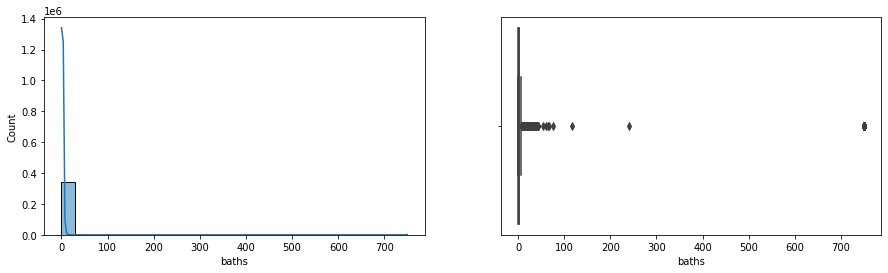

In [237]:
get_graphics(df,'baths',pd.Series())

Видим, что в данных наблюдаются выбросы. Попробуем отфильтровать их.

In [238]:
df[df['baths'] > 20]['baths'].value_counts()

baths
750.0    236
24.0      14
22.0      10
26.0       8
23.0       8
30.0       6
40.0       4
27.0       4
44.0       3
32.0       3
21.0       3
36.0       3
28.0       2
34.0       2
29.0       2
241.0      1
55.0       1
25.0       1
43.0       1
41.0       1
76.0       1
116.0      1
35.0       1
64.0       1
39.0       1
42.0       1
60.0       1
68.0       1
Name: count, dtype: int64

Filtered df shape = 340894; df shape = 341215


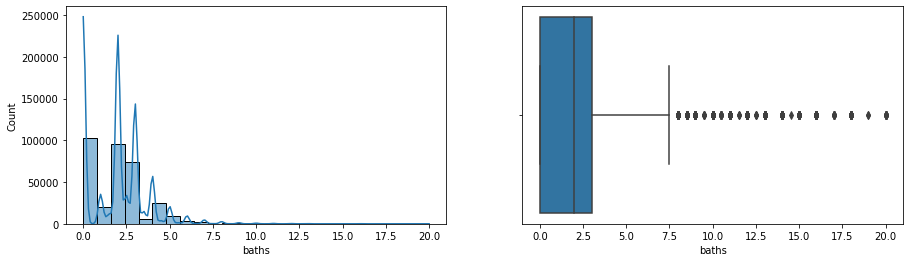

In [239]:
mask_baths = df['baths'] <= 20
print(f'Filtered df shape = {df[mask_baths].shape[0]}; df shape = {df.shape[0]}')

get_graphics(df,'baths',mask_baths)

In [240]:
print(f'df shape = {df.shape[0]}')
df.drop(df[df['baths'] > 20].index, axis=0, inplace=True)

print(f'df shape after delete = {df.shape[0]}')
df = df.reset_index(drop=True)

df shape = 341215
df shape after delete = 340894


Преобразуем в категории

In [241]:
def convert_bath(x):
    if x < 2:
        return '<2'
    elif x == 2:
        return '2'
    elif x == 3:
        return '3'
    elif x == 4:
        return '4'
    else:
        return '>4'

df['baths_cat'] = df['baths'].apply(convert_bath)

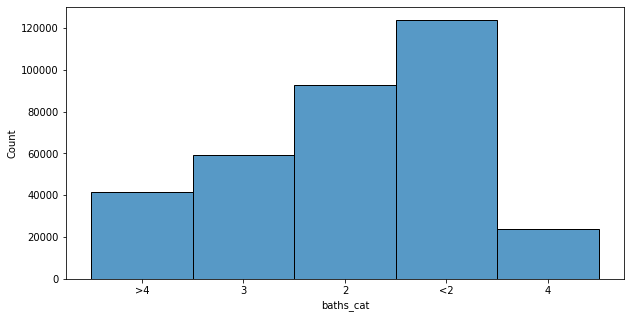

In [242]:
fig = plt.subplots(figsize=(10, 5))

sns.histplot(
    data=df,
    x='baths_cat',
    bins=25
);

In [243]:
df.drop(['baths'], axis=1, inplace=True)

Признак Sqft

In [244]:
df['sqft'].describe()

count    3.408940e+05
mean     6.240191e+03
std      1.571739e+06
min      0.000000e+00
25%      1.182000e+03
50%      1.752000e+03
75%      2.541000e+03
max      7.959794e+08
Name: sqft, dtype: float64

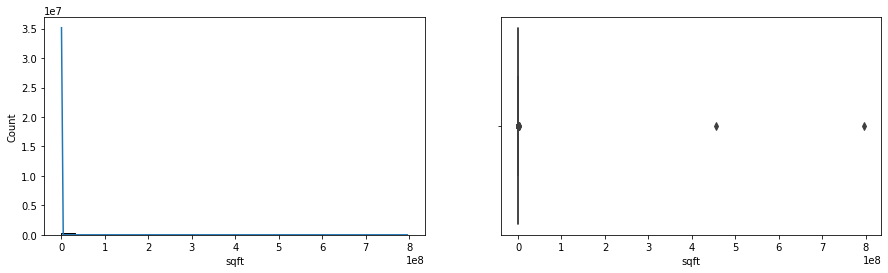

In [245]:
get_graphics(df,'sqft',pd.Series())

Попробуем посмотреть на данные в логарифмической шкале

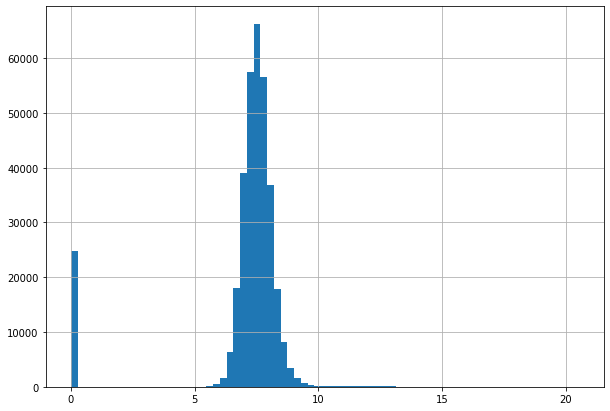

In [246]:
np.log(df['sqft']+1).hist(bins=75);

Похоже на нормальное распределение, кроме пенька с нулевой площадью (наши пропуски). Заменим нули на медианное значение

In [247]:
sqft_median = df['sqft'].median()
df['sqft'] = df['sqft'].apply(lambda x: sqft_median if x == 0 else x)

In [248]:
df['sqft_log'] = df['sqft'].apply(lambda x: np.log(x+1))

In [249]:
df.drop(['sqft'], axis=1, inplace=True)

Признак Stories

In [250]:
df['stories'].describe()

count      340894
unique         92
top       unknown
freq       109013
Name: stories, dtype: object

In [251]:
df['stories'].value_counts()

stories
unknown    109013
1.0        103965
2.0         85049
3.0         17350
0.0         11431
            ...  
1120.0          1
2.2             1
1002.0          1
96.0            1
65.0            1
Name: count, Length: 92, dtype: int64

In [252]:
df[df['stories'] == '1120.0']

,status,propertyType,fireplace,city,beds,state,stories,target,HasPrivatePool,Year built,Remodeled year,Heating,Cooling,Parking,lotsize,schools_rating,schools_Distance,schools_Grades,school_count,baths_cat,sqft_log
202045,for sale,condo,0,jacksonville,0,FL,1120.0,53000.0,0,73.0,41.0,Forced,Other,0,25.0,3.5,2.55,PK - 12,2,<2,6.054439


Поиском в интернете нашел информацию о кондоминиуме по адресу "311 W Ashley St APT 1111". Этажность здания = 16. Исправим ошибку

In [253]:
df.loc[df[df['stories'] == '1120.0'].index, 'stories'] = 16

In [254]:
df[df['stories'] == '1002.0']

,status,propertyType,fireplace,city,beds,state,stories,target,HasPrivatePool,Year built,Remodeled year,Heating,Cooling,Parking,lotsize,schools_rating,schools_Distance,schools_Grades,school_count,baths_cat,sqft_log
286332,for sale,townhouse,1,other,3,OR,1002.0,325000.0,0,16.0,-1.0,Forced,Other,1,2613.0,5.67,2.37,K - 12,3,<2,7.311886


In [255]:
df.loc[df[df['stories'] == '1002.0'].index, 'stories'] = 2

In [256]:
df['stories'].describe()

count      340894
unique         92
top       unknown
freq       109013
Name: stories, dtype: object

In [257]:
df.loc[df['stories'] == 'unknown', 'stories'] = -1

In [258]:
df.loc[df['stories'] == '1....', 'stories'] = 1

In [259]:
df['stories'] = df['stories'].astype('float')

In [260]:
mask_stories = (df['stories'] > 4) & (df['propertyType'] != 'condo') & (df['propertyType'] != 'cooperative') & (df['propertyType'] != 'apartment') 

df[mask_stories]['propertyType'].value_counts()

propertyType
single-family    135
townhouse        126
multi-family      27
traditional       17
unknown            6
other type         4
manufactured       3
contemporary       2
mediterranean      1
Name: count, dtype: int64

удалим дома свыше 4 этажей, кроме кондоминиумов, кооперативов, апартаментов

In [261]:
print(f'df shape = {df.shape[0]}')

df.drop(df[(df['stories'] > 4) & (df['propertyType'] != 'condo') & (df['propertyType'] != 'cooperative') & (df['propertyType'] != 'apartment')].index, axis=0, inplace=True)
print(f'df shape after delete = {df.shape[0]}')

df = df.reset_index(drop=True)

df shape = 340894
df shape after delete = 340573


In [262]:
#преобразуем в категории
def convert_stories_to_cat(x):
    if x == '-1':
        x = 'unknown'
    elif x == 1:
        return '1'
    elif x == 2:
        return '2'
    elif x == 3:
        return '3'
    elif x == 4:
        return '4'
    elif x == 5:
        return '5'
    elif x == 6:
        return '6'
    else:
        return '6 and more'

In [263]:
df['stories_cat'] = df['stories'].apply(convert_stories_to_cat)

In [264]:
df.drop(['stories'], axis=1, inplace=True)

Признак beds

In [265]:
df['beds'].describe()

count    340573.000000
mean          2.597379
std           1.799584
min           0.000000
25%           1.000000
50%           3.000000
75%           4.000000
max         144.000000
Name: beds, dtype: float64

In [266]:
df[df['beds']==144]

,status,propertyType,fireplace,city,beds,state,target,HasPrivatePool,Year built,Remodeled year,Heating,Cooling,Parking,lotsize,schools_rating,schools_Distance,schools_Grades,school_count,baths_cat,sqft_log,stories_cat
6641,active,multi-family,0,laredo,144,TX,1590000.0,0,-1.0,-1.0,Central Electric,Other,0,275258.0,7.0,1.81,PK - 12,8,2,11.040952,6 and more


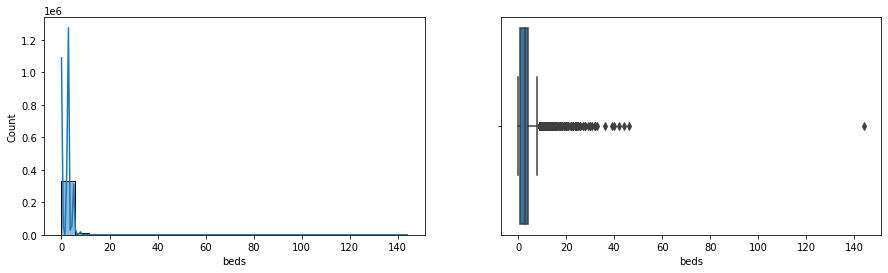

In [267]:
get_graphics(df,'beds',pd.Series())

In [268]:
print(df[df['beds'] == 144].shape[0])

df.drop(df[df['beds'] == 144].index, axis=0, inplace=True)
df = df.reset_index(drop=True)

1


In [269]:
def convert_beds(x):
    if x == 1:
        return '1'
    if x == 2:
        return '2'
    if x == 3:
        return '3'
    if x == 4:
        return '4'
    if x == 5:
        return '5'
    if x == 6:
        return '6'
    if x > 6:
        return '>6'

df['beds_cat'] = df['beds'].apply(convert_beds)

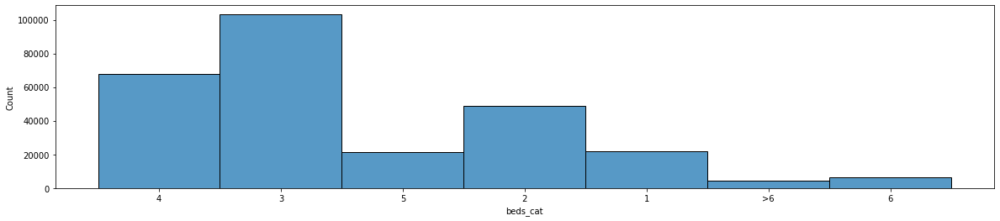

In [270]:
fig, axes = plt.subplots(figsize=(20, 4))

sns.histplot(
    data=df,
    x='beds_cat',
    bins=25
);

In [271]:
df.drop(['beds'], axis=1, inplace=True)

Признак Year built

In [272]:
df['Year built'].describe()

count    340572.000000
mean         37.959204
std          34.311674
min          -1.000000
25%           6.000000
50%          30.000000
75%          62.000000
max         319.000000
Name: Year built, dtype: float64

In [273]:
df[df['Year built'] == 319]

,status,propertyType,fireplace,city,state,target,HasPrivatePool,Year built,Remodeled year,Heating,Cooling,Parking,lotsize,schools_rating,schools_Distance,schools_Grades,school_count,baths_cat,sqft_log,stories_cat,beds_cat
157721,for sale,townhouse,1,philadelphia,PA,2800000.0,0,319.0,-1.0,Forced,Other,0,435.0,4.0,1.10,K - 12,2,<2,6.816736,2,2
288358,for sale,townhouse,1,philadelphia,PA,2800000.0,0,319.0,-1.0,Forced,Other,0,384.0,4.0,1.02,K - 12,2,<2,6.816736,2,2


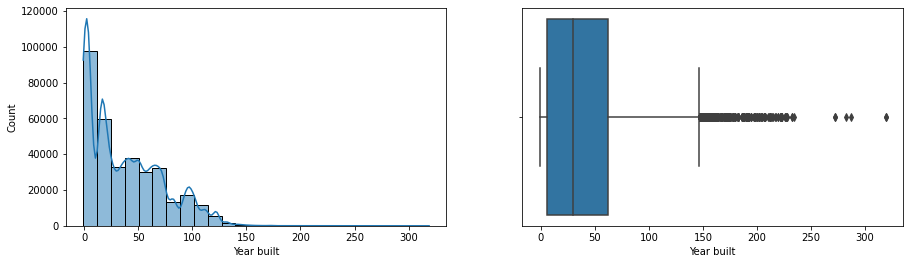

In [274]:
get_graphics(df,'Year built',pd.Series())

Признак Remodeled year

In [275]:
df['Remodeled year'].describe()

count    340572.000000
mean         15.928150
std          25.332184
min          -1.000000
25%          -1.000000
50%          -1.000000
75%          28.000000
max         283.000000
Name: Remodeled year, dtype: float64

In [276]:
# ситуации, когда "возраст" недвижимости < "возраста" ремонта
mask = (df['Year built'] <= df['Remodeled year']) & (df['Year built'] > 0) & (df['Remodeled year'] > 0)

print(df[mask].shape[0])
df[mask]

3387


,status,propertyType,fireplace,city,state,target,HasPrivatePool,Year built,Remodeled year,Heating,Cooling,Parking,lotsize,schools_rating,schools_Distance,schools_Grades,school_count,baths_cat,sqft_log,stories_cat,beds_cat
104,unknown,single-family,0,houston,TX,2197000.0,1,3.0,71.0,Other,Other,1,7318.00,7.67,0.90,PK - 12,3,>4,8.391857,2,4
163,active,detached,1,dallas,TX,6599000.0,0,12.0,13.0,No,Other,0,54014.40,6.00,3.53,Preschool - 12,4,<2,9.358674,6 and more,None
309,for sale,single-family,0,denver,CO,975000.0,0,7.0,61.0,Forced,Other,1,2334.00,3.00,0.67,PK - 12,3,4,7.756195,3,3
315,for sale,single-family,1,houston,TX,3655275.0,1,4.0,56.0,Other,Other,1,0.49,8.00,0.46,PK - 12,3,>4,8.791790,2,5
451,for sale,single-family,0,la jolla,CA,2999999.0,0,3.0,73.0,Forced,Other,1,3.00,9.00,0.97,K - 12,3,4,8.095904,6 and more,4
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
340270,for sale,multi-family,0,houston,TX,399995.0,0,3.0,71.0,Other,Other,1,5149.00,3.00,1.24,PK - 12,3,2,8.117014,2,4
340330,unknown,single-family,0,houston,TX,1099900.0,0,3.0,67.0,Other,Other,1,9073.00,6.33,1.10,PK - 12,3,4,8.335671,2,4
340353,for sale,single-family,0,cape coral,FL,395000.0,0,3.0,17.0,Forced,Other,1,10018.00,5.50,5.61,PK - 12,24,2,7.434257,1,3
340459,unknown,single-family,0,miami beach,FL,5500000.0,1,7.0,72.0,Forced,Other,1,9500.00,6.33,8.97,PK - 12,3,>4,8.258940,6 and more,5


In [277]:
df.drop(df[mask].index, axis=0, inplace=True)
df = df.reset_index(drop=True)

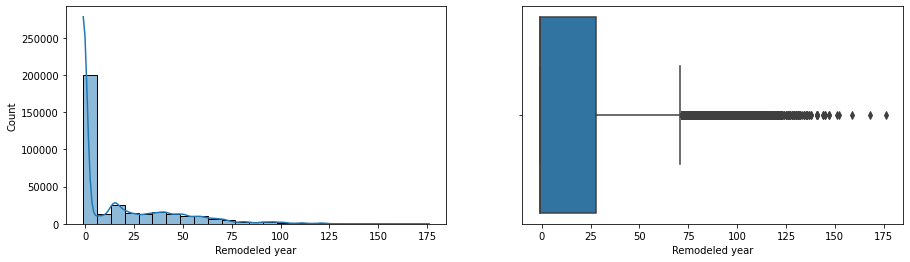

In [278]:
get_graphics(df,'Remodeled year',pd.Series())

Признак lotsize

In [279]:
df['lotsize'].describe()

count    3.371850e+05
mean     2.426253e+04
std      2.024750e+06
min      0.000000e+00
25%      0.000000e+00
50%      3.001000e+03
75%      7.501000e+03
max      7.606883e+08
Name: lotsize, dtype: float64

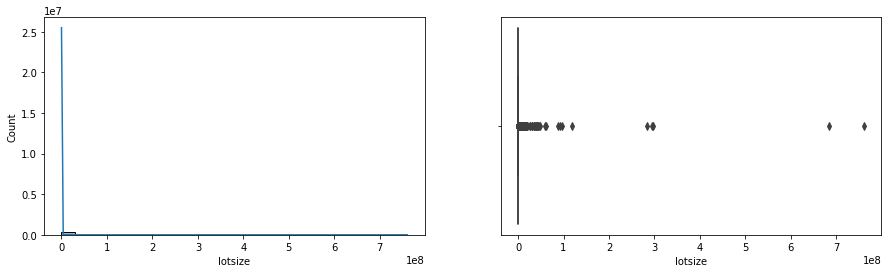

In [280]:
get_graphics(df,'lotsize',pd.Series())

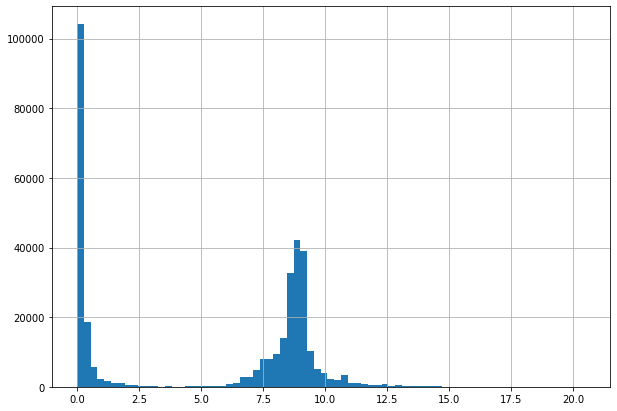

In [281]:
np.log(df['lotsize']+1).hist(bins=75);

In [282]:
df['lotsize_log'] = df['lotsize'].apply(lambda x: np.log(x+1))

In [283]:
df.drop(columns=['lotsize'], axis=1,inplace=True)

Признак target

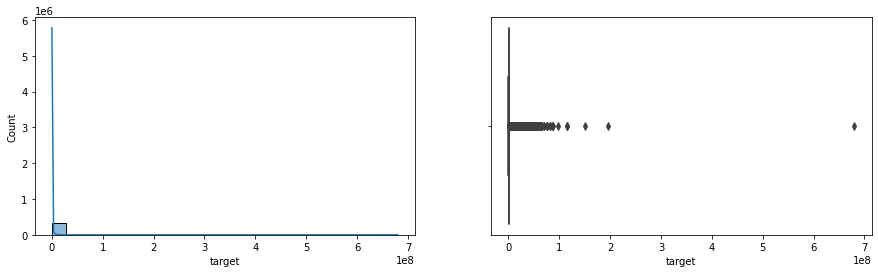

In [284]:
get_graphics(df,'target',pd.Series())

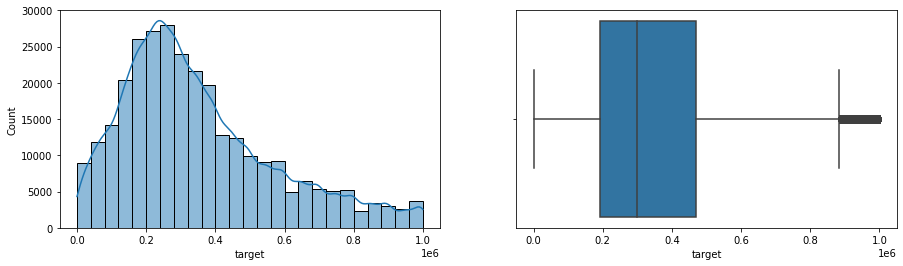

In [285]:
mask_target = df['target'] <= 1e6

get_graphics(df,'target',mask_target)

In [286]:
df.describe()

,fireplace,target,HasPrivatePool,Year built,Remodeled year,Parking,schools_rating,schools_Distance,school_count,sqft_log,lotsize_log
count,337185.000000,3.371850e+05,337185.000000,337185.000000,337185.000000,337185.000000,337185.000000,337185.000000,337185.000000,337185.000000,337185.000000
mean,0.287299,6.575376e+05,0.128069,38.228133,15.584821,0.541854,5.052874,2.755054,4.212625,7.536562,5.321290
std,0.452503,2.102446e+06,0.334167,34.334764,25.040585,0.498246,1.996249,6.082578,4.533870,0.575381,4.312405
min,0.000000,1.000000e+00,0.000000,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.693147,0.000000
25%,0.000000,2.089000e+05,0.000000,7.000000,-1.000000,0.000000,3.500000,1.010000,3.000000,7.199678,0.000000
50%,0.000000,3.360000e+05,0.000000,30.000000,-1.000000,1.000000,5.000000,1.700000,3.000000,7.469084,8.007034
75%,1.000000,5.990000e+05,0.000000,62.000000,28.000000,1.000000,6.330000,3.080000,5.000000,7.833996,8.922925
max,1.000000,6.800012e+08,1.000000,319.000000,176.000000,1.000000,10.000000,1590.830000,65.000000,20.495084,20.449734


In [287]:
# сохраним данные в файл
df.to_csv('data/df_after_cleaning.csv')

## Часть 3. Визуализация

In [370]:
df = pd.read_csv('data/df_after_cleaning.csv')
df.drop(['Unnamed: 0'], axis=1, inplace=True)

Зависимость стоимости от типа недвижимости

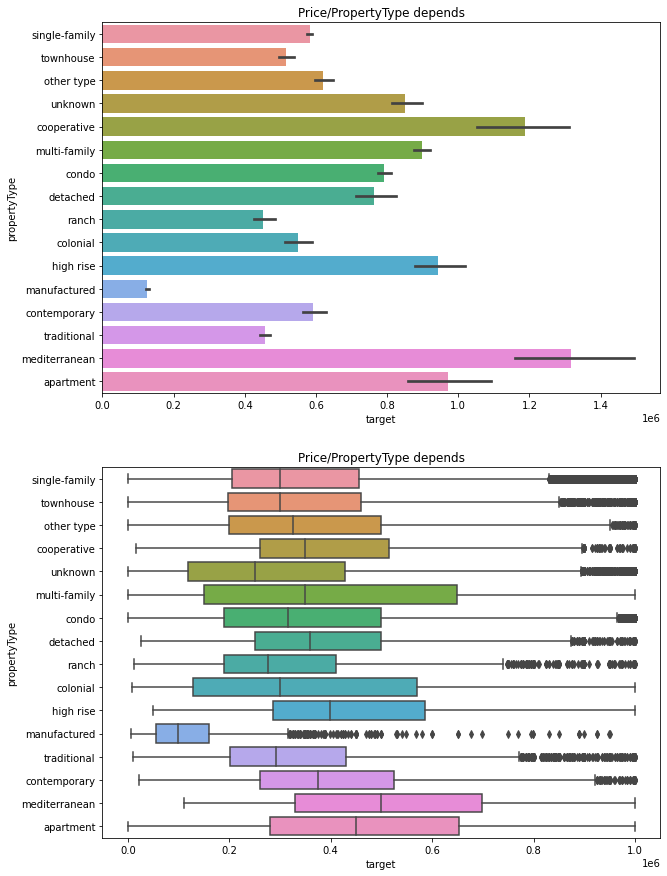

In [371]:
fig, axes = plt.subplots(nrows=2, ncols=1, figsize=(10, 15))

sns.barplot(data=df, x="target", y="propertyType", orient="h", ax=axes[0]).set_title('Price/PropertyType depends');
sns.boxplot(data=df[df['target'] < 1e6], x="target", y="propertyType", orient="h", ax=axes[1]).set_title('Price/PropertyType depends');

Сразу замечаем выбросы, причем далеко в правой границе. Разбор таких ситуаций можно отложить на следующей итерации.
Самый широкий разброс цен для multi-family, потребуется анализ. Самый дешевый тип это manufactured, однако у них есть наблюдаются вероятные "выбросы". Среди дорогих это mediterranean и apartment. Single-family, townhouse имеют примерно одинаковый разброс цен, примерно на том же уровне квартира в condominium.

Проанализируем фабричные дома (manufactured) в разрезе этажности

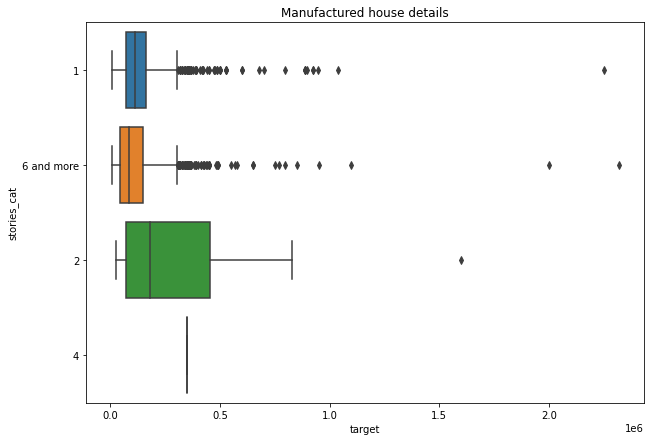

In [372]:
sns.boxplot(data=df[(df['propertyType'] == 'manufactured')], x="target", y="stories_cat", orient="h").set_title('Manufactured house details');

Обращаем внимание на высокоэтажные (от 4 этажей) для фабричных домов. Удалим их пока.

In [373]:
mask = (df['propertyType'] == 'manufactured') & ((df['stories_cat'] == '6 and more') | (df['stories_cat'] == '4'))
df.drop(df[mask].index, inplace=True)

Рассмотрим одно семейные дома

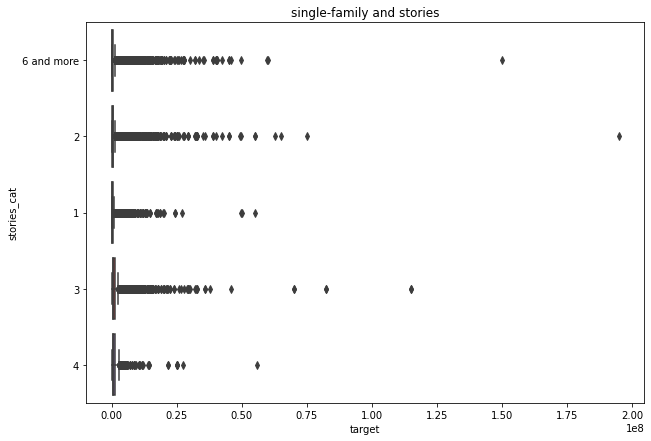

In [374]:
sns.boxplot(data=df[(df['propertyType'] == 'single-family')], x="target", y="stories_cat", orient="h").set_title('single-family and stories');

Обращаем внимание на односемейные дома свыше 6 этажей. Удалим найденные выбросы.

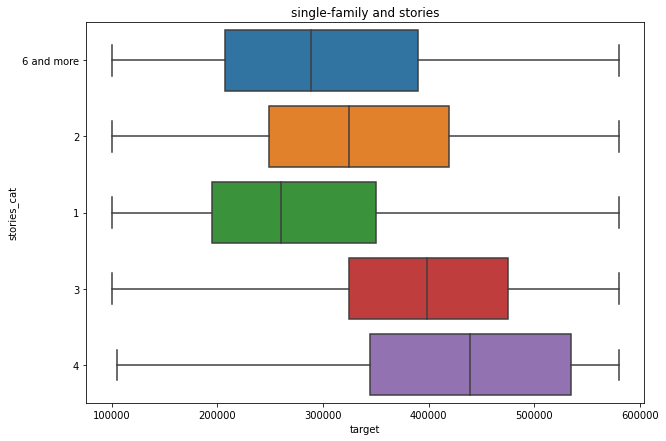

In [375]:
mask = (df['propertyType'] == 'single-family') & ((df['target'] <= 0.58e6) & (df['target'] >= 1e5))
sns.boxplot(data=df[mask], x="target", y="stories_cat", orient="h").set_title('single-family and stories');

df.drop(df[(df['propertyType'] == 'single-family') & ((df['target'] >= 0.58e6) & (df['target'] <= 1e5))].index, inplace=True)

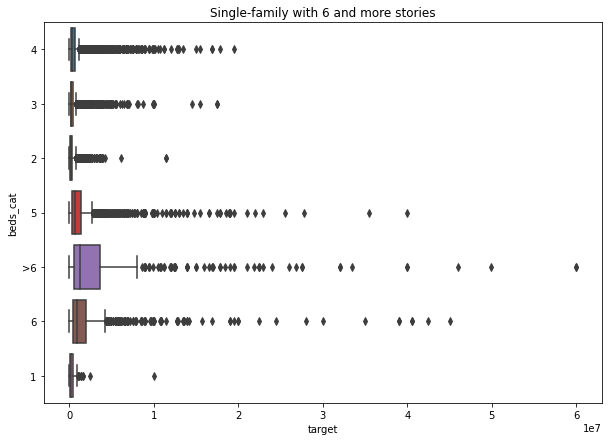

In [376]:
sns.boxplot(data=df[(df['propertyType'] == 'single-family') & (df['stories_cat'] == '6 and more')], x="target", y="beds_cat", orient="h").set_title('Single-family with 6 and more stories');

Зависимость стоимости от этажности

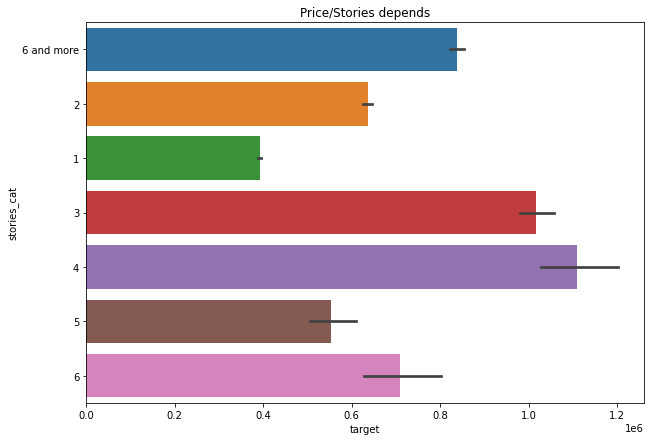

In [377]:
sns.barplot(data=df, x="target", y="stories_cat", orient="h").set_title('Price/Stories depends');

Самые дорогие дома 3 и 4 этажные дома - почти в 2 раза дороже 1 этажных. А также двухэтажные дома по стоимости равные 5-6 этажным. Посмотрим, какие дома бывают 5 и 6 этажными.

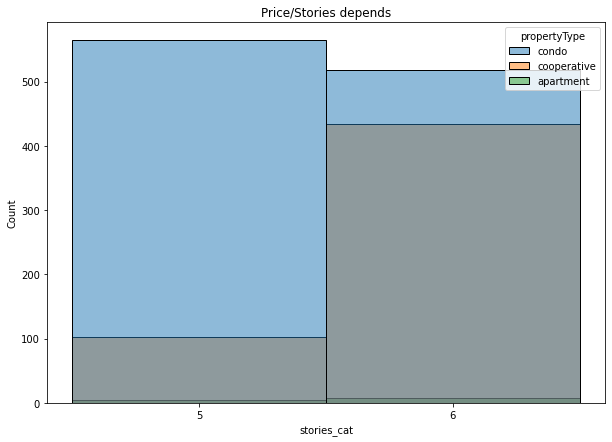

In [378]:
sns.histplot(data=df[(df['stories_cat'] == '5') | (df['stories_cat'] == '6')], x="stories_cat", hue ="propertyType").set_title('Price/Stories depends');

Видим, что среди 5 и 6 этажных домов встречаются кондоминиумы, кооперативы и апартамены.

Зависимость стоимости от количества спален и ванных комнат

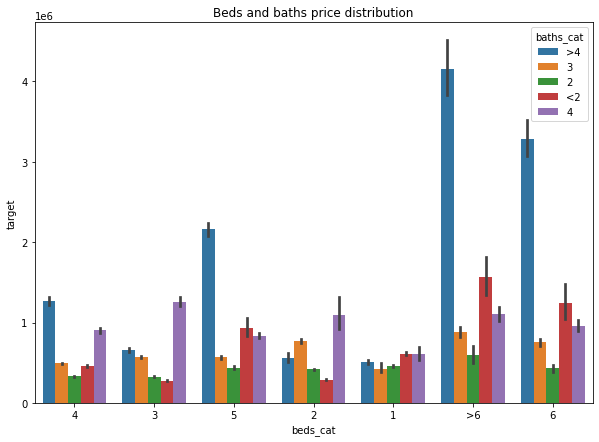

In [379]:
sns.barplot(data=df, y="target", x="beds_cat", orient="v", hue="baths_cat").set_title('Beds and baths price distribution');

Посмотрим на среднюю стоимость квадратного фута

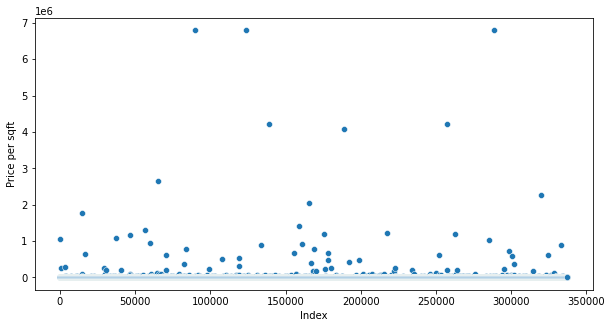

In [380]:
price_per_sqft = round(df['target'] / np.exp(df['sqft_log'] - 1), 1)

fig, ax = plt.subplots(figsize=(10, 5))

sns.scatterplot(x=price_per_sqft.index, y=price_per_sqft, ax=ax)

ax.set_xlabel('Index')
ax.set_ylabel('Price per sqft');

Видим, что есть дома с высокой стоимостью квадратного фута

Распределение домов по возрастам

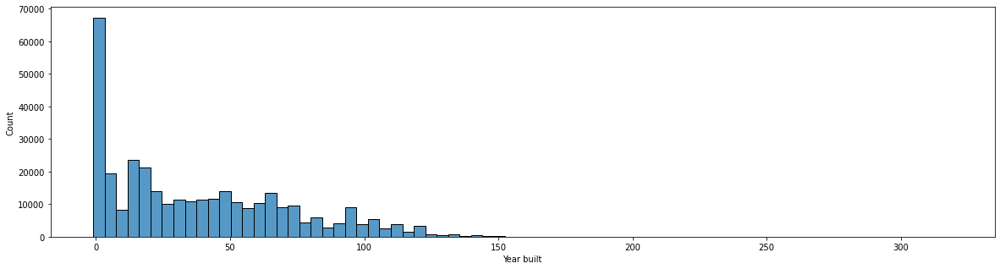

In [381]:
fig, axes = plt.subplots(figsize=(20, 5))
sns.histplot(data=df,x='Year built', bins=75);

Основную массу составляют новостройки (до 2 лет). Затем идут дома до 10 лет, следом дома до 100 лет.

In [382]:
# сохраним данные в файл
df.to_csv('data/df_after_cleaning.csv')

## Часть 4. Готовим данные к машинному обучению

In [2]:
data = pd.read_csv('data/df_after_cleaning.csv')
data.drop(['Unnamed: 0'], axis=1, inplace=True)

Выделим категориальные признаки

In [3]:
col_cat = data.select_dtypes(exclude=[np.number]).columns.values
col_cat

array(['status', 'propertyType', 'city', 'state', 'Heating', 'Cooling',
       'schools_Grades', 'baths_cat', 'stories_cat', 'beds_cat'],
      dtype=object)

Числовые признаки

In [4]:
col_num = data.select_dtypes(include=[np.number]).columns.values
col_num

array(['fireplace', 'target', 'HasPrivatePool', 'Year built',
       'Remodeled year', 'Parking', 'schools_rating', 'schools_Distance',
       'school_count', 'sqft_log', 'lotsize_log'], dtype=object)

In [5]:
# Перенесем два признака в категориальные признаки
col_cat = col_cat.tolist()
col_cat.append('HasPrivatePool')
col_cat.append('Parking')

col_num = col_num.tolist()
col_num.remove('HasPrivatePool')
col_num.remove('Parking')

In [387]:
for column in col_cat:
    print('Число уникальных значений признака {}: '.format(column), data[column].nunique())

Число уникальных значений признака status:  16
Число уникальных значений признака propertyType:  16
Число уникальных значений признака city:  251
Число уникальных значений признака state:  37
Число уникальных значений признака Heating:  25
Число уникальных значений признака Cooling:  145
Число уникальных значений признака schools_Grades:  56
Число уникальных значений признака baths_cat:  5
Число уникальных значений признака stories_cat:  7
Число уникальных значений признака beds_cat:  7
Число уникальных значений признака HasPrivatePool:  2
Число уникальных значений признака Parking:  2


Признаки status, propertyType, state, Heating, Cooling, schools_Grades  содержат более 15 значений. Поэтому бинарно кодируем их.

In [6]:
col_to_bin = ['status','propertyType','city','state','Heating','Cooling','schools_Grades']

bin_encoder = ce.BinaryEncoder(cols=col_to_bin)
type_bin = bin_encoder.fit_transform(data[col_to_bin])
data = pd.concat([data, type_bin], axis=1)

In [7]:
# удаляем признаки
data.drop(columns=col_to_bin, axis=1,inplace=True)

Однократное кодирование для остальных категориальных признаков

In [8]:
data = pd.get_dummies(data = data, columns=['baths_cat','stories_cat','beds_cat'])

In [391]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 335325 entries, 0 to 335324
Data columns (total 73 columns):
 #   Column                  Non-Null Count   Dtype  
---  ------                  --------------   -----  
 0   fireplace               335325 non-null  int64  
 1   target                  335325 non-null  float64
 2   HasPrivatePool          335325 non-null  int64  
 3   Year built              335325 non-null  float64
 4   Remodeled year          335325 non-null  float64
 5   Parking                 335325 non-null  int64  
 6   schools_rating          335325 non-null  float64
 7   schools_Distance        335325 non-null  float64
 8   school_count            335325 non-null  int64  
 9   sqft_log                335325 non-null  float64
 10  lotsize_log             335325 non-null  float64
 11  status_0                335325 non-null  int64  
 12  status_1                335325 non-null  int64  
 13  status_2                335325 non-null  int64  
 14  status_3            

In [9]:
X = data.drop('target', axis=1)
y = data['target']
#выделим тренировочную и тестовые выборки
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=RANDOM_SEED)
#выделим валидационную выборку
#X_val, X_test, y_val, y_test = train_test_split(X_test, y_test, test_size=0.5, random_state=RANDOM_SEED)

In [10]:
col_num.remove('target')

In [394]:
stat, p = normaltest(data['target'])
print ('p=%.3f\n' % (p))

if p > 0.05:
    print('Target probably normal')
else:
    print('Target probably not normal')

p=0.000

Target probably not normal


In [395]:
stat, p = normaltest(data['lotsize_log'])
print ('p=%.3f\n' % (p))

if p > 0.05:
    print('lotsize_log probably normal')
else:
    print('lotsize_log probably not normal')

p=0.000

lotsize_log probably not normal


In [396]:
stat, p = normaltest(data['sqft_log'])
print ('p=%.3f\n' % (p))

if p > 0.05:
    print('sqft_log probably normal')
else:
    print('sqft_log probably not normal')

p=0.000

sqft_log probably not normal


Признаки не распределены нормально, поэтому можем использовать нормализацию

In [11]:
scaler = RobustScaler()

X_train_scaled = scaler.fit_transform(X_train)
#X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)

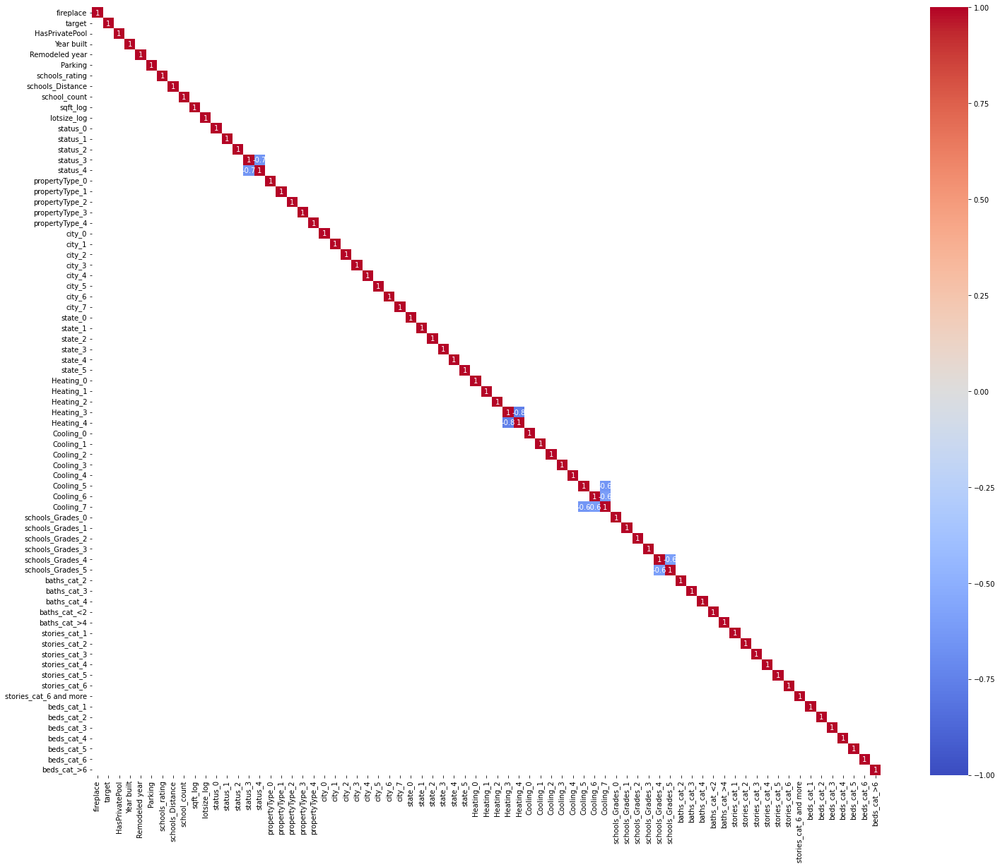

In [398]:
corr = data.corr()

# выведем только данные с высоким уровнем корреляции
mask_1 = np.abs(corr) >= 0.6
mask_2 = np.abs(corr) <= -0.6

corr_data = corr[mask_1 | mask_2]

plt.rcParams['figure.figsize'] = (25,20)

#fmt отвечает за количество знаков после точки
sns.heatmap(corr_data, annot=True, fmt='.1g', vmin=-1, vmax=1, center= 0, cmap= 'coolwarm');

In [12]:
#удаляем коррелированные признаки
data.drop(columns=['status_4','Heating_4'], axis=1,inplace=True)

In [400]:
# выбираем 25 признаков методом KBest
selector = SelectKBest(f_regression, k=25)
selector.fit(X_train, y_train)

col_names_kbest = selector.get_feature_names_out()

X_train_best = X_train[col_names_kbest]

col_names_kbest

array(['HasPrivatePool', 'schools_rating', 'sqft_log', 'lotsize_log',
       'propertyType_2', 'city_2', 'city_3', 'city_4', 'city_7',
       'state_1', 'state_2', 'state_3', 'state_5', 'Heating_3',
       'schools_Grades_5', 'baths_cat_2', 'baths_cat_4', 'baths_cat_>4',
       'stories_cat_1', 'stories_cat_6 and more', 'beds_cat_2',
       'beds_cat_3', 'beds_cat_5', 'beds_cat_6', 'beds_cat_>6'],
      dtype=object)

## Часть 5. ML

Функция для вывода веса признаков

In [13]:
'''Необходимые списки, чтобы хранить результаты'''
model_name_list=[]
#mae_val_list = []; 
mae_train_list = []
#mape_val_list = []; 
mape_train_list = []   
#r2_val_list = []; 
r2_train_list = []

Функция расчета метрик

In [14]:
def show_metrics(y, y_pred):
    mae = mean_absolute_error(y, y_pred)
    mape = mean_absolute_percentage_error(y, y_pred)
    r2 = r2_score(y, y_pred)
    
    print(f"MAE: {mae:0.2f}")
    print(f"MAPE: {mape:0.2f}")
    print(f"r2-score: {r2:0.2f}")
    
    '''Добавим метрики в списки'''
    mae_train_list.append(mae)
    mape_train_list.append(mape)
    r2_train_list.append(r2)

Функции для расчета rmse и mape

In [15]:
def rmse(y_true, y_pred):
    return np.sqrt(((y_true - y_pred) ** 2).mean())    

def mape(y_true, y_pred):
    y_true, y_pred = np.array(y_true), np.array(y_pred)
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 100

Зададим baseline - предскажем средним значением

In [450]:
y_train_pred_naive = y_train.mean()
y_test_pred_naive = y_test.mean()
print (f"Y_train mean = {y_train_pred_naive:0.2f}; y_test mean = {y_test_pred_naive:0.2f}")

Y_train mean = 662875.11; y_test mean = 676000.95


In [451]:
y_train_pred_mean = [y_train_pred_naive for x in range(len(y_train))]
y_test_pred_mean = [y_test_pred_naive for x in range(len(y_test))]

In [452]:
print('train metrics:')
show_metrics(y_train, y_train_pred_mean)
print()
print('test metrics:')
show_metrics(y_test, y_test_pred_mean)

MAE: 575290.39
MAPE: 24.36
r2-score: 0.00

MAE: 595051.57
MAPE: 5.38
r2-score: 0.00


### LinearRegression

In [488]:
lr = LinearRegression(n_jobs=-1);

%time lr.fit(X_train, y_train)

lr_predict_train = lr.predict(X_train)
lr_predict_test = lr.predict(X_test)

print('train metrics:')
show_metrics(y_train, lr_predict_train)
print()
print('test metrics:')
show_metrics(y_test, lr_predict_test)

train metrics:
MAE: 530895.06
MAPE: 14.16
r2-score: 0.10

test metrics:
MAE: 542193.52
MAPE: 4.60
r2-score: 0.05
CPU times: total: 2.42 s
Wall time: 2.62 s


Проверим результат на нормализованных данных

In [489]:
lr = LinearRegression(n_jobs=-1);

%time lr.fit(X_train_scaled, y_train)

lr_predict_train_scaled = lr.predict(X_train_scaled)
lr_predict_test_scaled = lr.predict(X_test_scaled)

print('train metrics:')
show_metrics(y_train, lr_predict_train_scaled)
print()
print('test metrics:')
show_metrics(y_test, lr_predict_test_scaled)

train metrics:
MAE: 575626.97
MAPE: 24.35
r2-score: 0.00

test metrics:
MAE: 585665.02
MAPE: 5.37
r2-score: 0.00
CPU times: total: 2.36 s
Wall time: 2.37 s


Нормализация не смогла улучшить результат.

### RandomForestRegressor

In [457]:
rfr = RandomForestRegressor(random_state=RANDOM_SEED)

%time rfr.fit(X_train, y_train)

rfr_pred_train = rfr.predict(X_train)
rfr_pred_test = rfr.predict(X_test)

CPU times: total: 5min 32s
Wall time: 6min 56s


In [485]:
print('train metrics:')
show_metrics(y_train, rfr_pred_train)
print()
print('test metrics:')
show_metrics(y_test, rfr_pred_test)

train metrics:
MAE: 101305.38
MAPE: 7.34
r2-score: 0.88

test metrics:
MAE: 133967.69
MAPE: 0.77
r2-score: 0.85


Проверим результаты с кросс-валидацией

In [459]:
%%time

#Создаём модель
rfr_cv = RandomForestRegressor(
    random_state=RANDOM_SEED #генератор случайных чисел  
)
 
#Создаём объект кросс-валидатора KFold
kf = KFold(n_splits=5)
#Создаём списки для хранения тренировочных и валидационных метрик
train_metrics_mae = []
train_metrics_mape = []
train_metrics_r2 = []
val_metrics_mae = []
val_metrics_mape = []
val_metrics_r2 = []
#Организуем цикл для кросс-валидации (используем весь набор данных)
#train_index — индексы тренировочной выборки
#valid_index — индексы валидационной выборки
for train_index, valid_index in kf.split(X, y): 
    #Создаём тренировочную и валидационную выборку, обращаясь по текущим индексам
    X_train, y_train = X.iloc[train_index], y.iloc[train_index]
    X_valid, y_valid = X.iloc[valid_index], y.iloc[valid_index]
    #Обучаем модель на тренировочной выборке
    rfr_cv.fit(X_train, y_train)
    #Делаем предсказание для каждой из выборок
    y_train_pred = rfr_cv.predict(X_train)
    y_valid_pred = rfr_cv.predict(X_valid)
    #Рассчитываем метрику и заносим её в список
    train_metrics_mae.append(mean_absolute_error(y_train, y_train_pred))
    train_metrics_mape.append(mean_absolute_percentage_error(y_train, y_train_pred))
    train_metrics_r2.append(r2_score(y_train, y_train_pred))
    val_metrics_mae.append(mean_absolute_error(y_valid, y_valid_pred))
    val_metrics_mape.append(mean_absolute_percentage_error(y_valid, y_valid_pred))
    val_metrics_r2.append(r2_score(y_valid, y_valid_pred))

CPU times: total: 30min 22s
Wall time: 32min 51s


In [460]:
print('Train k-fold mean mae: {:.2f}'.format(np.mean(train_metrics_mae)))
print('Train k-fold mean mape: {:.2f}'.format(np.mean(train_metrics_mape)))
print('Train k-fold mean r2: {:.2f}'.format(np.mean(train_metrics_r2)))
print()
print('Valid k-fold mean mae: {:.2f}'.format(np.mean(val_metrics_mae)))
print('Valid k-fold mean mape: {:.2f}'.format(np.mean(val_metrics_mape)))
print('Valid k-fold mean r2: {:.2f}'.format(np.mean(val_metrics_r2)))

Train k-fold mean mae: 100678.44
Train k-fold mean mape: 7.66
Train k-fold mean r2: 0.88

Valid k-fold mean mae: 237609.64
Valid k-fold mean mape: 14.76
Valid k-fold mean r2: 0.45


Результат на трейне совпал, однако на тесте результат уже похуже - метрики примерно в 2.5 раза хуже.

Попробуем "поиграть" с параметрами.

In [475]:
rf_2params = RandomForestRegressor(max_depth=10, random_state= RANDOM_SEED)

%time rf_2params.fit(X_train, y_train)

rf_2params_pred_train = rf_2params.predict(X_train)
rf_2params_pred_test = rf_2params.predict(X_test)

CPU times: total: 7min 1s
Wall time: 58.9 s


In [476]:
print('train metrics:')
show_metrics(y_train, rf_2params_pred_train)
print()
print('test metrics:')
show_metrics(y_test, rf_2params_pred_test)

train metrics:
MAE: 299772.92
MAPE: 10.75
r2-score: 0.50

test metrics:
MAE: 313247.11
MAPE: 2.20
r2-score: 0.35


RandomForestRegressor с 4 параметрами

In [ ]:
rf_4params = RandomForestRegressor(max_depth = 15,
                                    min_samples_split = 10,
                                    min_samples_leaf = 5,
                                    criterion = 'absolute_error',
                                    random_state= RANDOM_SEED
                                )
%time rf_4params.fit(X_train, y_train)

rf_4params_pred_train = rf_4params.predict(X_train)
rf_4params_pred_test = rf_4params.predict(X_test)

CPU times: total: 13min 2s
Wall time: 1min 42s


In [ ]:
print('train metrics:')
show_metrics(y_train, rf_4params_pred_train)
print()
print('test metrics:')
show_metrics(y_test, rf_4params_pred_test)

train metrics:
MAE: 216501.13
MAPE: 11.56
r2-score: 0.45

test metrics:
MAE: 236957.03
MAPE: 1.38
r2-score: 0.27


Попробуем подобрать гиперпараметры

In [18]:
param_grid = [
              {'min_samples_leaf': [5, 10, 15] ,
              'min_samples_split': [5, 10, 15],
              'max_depth': [5, 10, 15, 25, 50]}
]

random_search = RandomizedSearchCV(
    estimator = RandomForestRegressor(random_state=RANDOM_SEED),
    param_distributions = param_grid, 
    cv = 5, 
    n_jobs = -1
)  


In [19]:
%time random_search.fit(X_train, y_train);

CPU times: total: 9min 49s
Wall time: 1h 32min 9s


RandomizedSearchCV(cv=5, estimator=RandomForestRegressor(random_state=42),
                   n_jobs=-1,
                   param_distributions=[{'max_depth': [5, 10, 15, 25, 50],
                                         'min_samples_leaf': [5, 10, 15],
                                         'min_samples_split': [5, 10, 15]}])

In [23]:
gs_train_pred = random_search.predict(X_train)
gs_test_pred = random_search.predict(X_test)

print('train metrics:')
show_metrics(y_train, gs_train_pred)
print()
print('test metrics:')
show_metrics(y_test, gs_test_pred)

print("Наилучшие значения гиперпараметров: {}".format(random_search.best_params_))
# {'min_samples_split': 10, 'min_samples_leaf': 5, 'max_depth': 15}

train metrics:
MAE: 224828.96
MAPE: 13.46
r2-score: 0.70

test metrics:
MAE: 281700.24
MAPE: 2.08
r2-score: 0.18
Наилучшие значения гиперпараметров: {'min_samples_split': 10, 'min_samples_leaf': 5, 'max_depth': 15}


### DecisionTreeRegressor

In [479]:
dtr = DecisionTreeRegressor(
    max_depth=1,
    criterion='squared_error', #критерий информативности
    random_state=RANDOM_SEED #генератор случайных чисел
)

%time dtr.fit(X_train, y_train)

dtr_pred_train = dtr.predict(X_train)
dtr_pred_test = dtr.predict(X_test)

CPU times: total: 266 ms
Wall time: 272 ms


In [480]:
print('train metrics:')
show_metrics(y_train, dtr_pred_train)
print()
print('test metrics:')
show_metrics(y_test, dtr_pred_test)

train metrics:
MAE: 527245.70
MAPE: 21.00
r2-score: 0.07

test metrics:
MAE: 538826.34
MAPE: 4.57
r2-score: 0.03


In [481]:
%%time

#Создаём модель
dtr_3params = DecisionTreeRegressor(
    criterion='squared_error', #критерий информативности
    max_depth=7, #максимальная глубина
    min_samples_leaf=5, #минимальное число объектов в листе
    random_state=RANDOM_SEED #генератор случайных чисел  
)
 
#Создаём объект кросс-валидатора KFold
kf = KFold(n_splits=5)
#Создаём списки для хранения тренировочных и валидационных метрик
train_metrics_mae = []
train_metrics_mape = []
train_metrics_r2 = []
val_metrics_mae = []
val_metrics_mape = []
val_metrics_r2 = []
#Организуем цикл для кросс-валидации (используем весь набор данных)
#train_index — индексы тренировочной выборки
#valid_index — индексы валидационной выборки
for train_index, valid_index in kf.split(X, y): 
    #Создаём тренировочную и валидационную выборку, обращаясь по текущим индексам
    X_train, y_train = X.iloc[train_index], y.iloc[train_index]
    X_valid, y_valid = X.iloc[valid_index], y.iloc[valid_index]
    #Обучаем модель на тренировочной выборке
    dtr_3params.fit(X_train, y_train)
    #Делаем предсказание для каждой из выборок
    y_train_pred = dtr_3params.predict(X_train)
    y_valid_pred = dtr_3params.predict(X_valid)
    #Рассчитываем метрику и заносим её в список
    train_metrics_mae.append(mean_absolute_error(y_train, y_train_pred))
    train_metrics_mape.append(mean_absolute_percentage_error(y_train, y_train_pred))
    train_metrics_r2.append(r2_score(y_train, y_train_pred))
    val_metrics_mae.append(mean_absolute_error(y_valid, y_valid_pred))
    val_metrics_mape.append(mean_absolute_percentage_error(y_valid, y_valid_pred))
    val_metrics_r2.append(r2_score(y_valid, y_valid_pred))

CPU times: total: 6.98 s
Wall time: 7.12 s


In [482]:
print('Train k-fold mean mae: {:.2f}'.format(np.mean(train_metrics_mae)))
print('Train k-fold mean mape: {:.2f}'.format(np.mean(train_metrics_mape)))
print('Train k-fold mean r2: {:.2f}'.format(np.mean(train_metrics_r2)))
print()
print('Valid k-fold mean mae: {:.2f}'.format(np.mean(val_metrics_mae)))
print('Valid k-fold mean mape: {:.2f}'.format(np.mean(val_metrics_mape)))
print('Valid k-fold mean r2: {:.2f}'.format(np.mean(val_metrics_r2)))

Train k-fold mean mae: 380213.01
Train k-fold mean mape: 13.51
Train k-fold mean r2: 0.29

Valid k-fold mean mae: 388547.54
Valid k-fold mean mape: 13.40
Valid k-fold mean r2: 0.28


Попробуем подобрать гиперпараметры

In [24]:
param_grid = [
              {'min_samples_leaf': [5, 10, 15] ,
              'min_samples_split': [5, 10, 15],
              'max_depth': [5, 10, 15, 25, 50]}
]

random_search = RandomizedSearchCV(
    estimator = DecisionTreeRegressor (random_state=RANDOM_SEED),
    param_distributions = param_grid, 
    cv = 5, 
    n_jobs = -1
)  


In [25]:
%time random_search.fit(X_train, y_train);

CPU times: total: 11.6 s
Wall time: 3min 9s


RandomizedSearchCV(cv=5, estimator=DecisionTreeRegressor(random_state=42),
                   n_jobs=-1,
                   param_distributions=[{'max_depth': [5, 10, 15, 25, 50],
                                         'min_samples_leaf': [5, 10, 15],
                                         'min_samples_split': [5, 10, 15]}])

In [26]:
gs_train_pred = random_search.predict(X_train)
gs_test_pred = random_search.predict(X_test)

print('train metrics:')
show_metrics(y_train, gs_train_pred)
print()
print('test metrics:')
show_metrics(y_test, gs_test_pred)

print("Наилучшие значения гиперпараметров: {}".format(random_search.best_params_))
# {'min_samples_split': 5, 'min_samples_leaf': 15, 'max_depth': 15}

train metrics:
MAE: 269191.05
MAPE: 13.13
r2-score: 0.58

test metrics:
MAE: 318739.87
MAPE: 1.88
r2-score: 0.15
Наилучшие значения гиперпараметров: {'min_samples_split': 5, 'min_samples_leaf': 15, 'max_depth': 15}


### GradientBoosting

In [483]:
gbr = GradientBoostingRegressor(random_state=RANDOM_SEED)
%time gbr.fit(X_train, y_train)

gbr_pred_train = gbr.predict(X_train)
gbr_pred_test = gbr.predict(X_test)

CPU times: total: 54.4 s
Wall time: 55.3 s


In [484]:
print('train metrics:')
show_metrics(y_train, gbr_pred_train)
print()
print('test metrics:')
show_metrics(y_test, gbr_pred_test)

train metrics:
MAE: 372450.37
MAPE: 16.27
r2-score: 0.26

test metrics:
MAE: 385491.54
MAPE: 2.49
r2-score: 0.13


### AdaBoostRegressor

In [27]:
ada = AdaBoostRegressor(DecisionTreeRegressor(random_state=RANDOM_SEED), random_state=RANDOM_SEED, learning_rate=0.01)

%time ada.fit(X_train, y_train)

ada_pred_train = ada.predict(X_train)
ada_pred_test = ada.predict(X_test)

In [30]:
print('train metrics:')
show_metrics(y_train, ada_pred_train)
print()
print('test metrics:')
show_metrics(y_test, ada_pred_test)

train metrics:
MAE: 23506.41
MAPE: 4.48
r2-score: 0.93

test metrics:
MAE: 219975.51
MAPE: 0.80
r2-score: 0.17


### CatBoostRegressor

In [33]:
cbr = CatBoostRegressor(learning_rate=0.1, n_estimators=100, depth=7)

%time cbr.fit(X_train, y_train)

cbr_pred_train = cbr.predict(X_train)
cbr_pred_test = cbr.predict(X_test)

0:	learn: 1648021.2257194	total: 456ms	remaining: 45.2s
1:	learn: 1605523.8388125	total: 784ms	remaining: 38.4s
2:	learn: 1569596.9713948	total: 1.21s	remaining: 39.3s
3:	learn: 1537790.9742837	total: 1.71s	remaining: 41s
4:	learn: 1510585.9270950	total: 2.39s	remaining: 45.5s
5:	learn: 1485377.6033881	total: 2.7s	remaining: 42.3s
6:	learn: 1462116.9294653	total: 3.44s	remaining: 45.7s
7:	learn: 1441721.7410982	total: 3.75s	remaining: 43.1s
8:	learn: 1421649.5006353	total: 4.14s	remaining: 41.9s
9:	learn: 1405146.3306571	total: 4.58s	remaining: 41.2s
10:	learn: 1392062.2931320	total: 4.96s	remaining: 40.1s
11:	learn: 1376870.3777255	total: 5.35s	remaining: 39.3s
12:	learn: 1363808.5848429	total: 5.7s	remaining: 38.1s
13:	learn: 1348886.7738132	total: 6.18s	remaining: 38s
14:	learn: 1335639.4131568	total: 6.53s	remaining: 37s
15:	learn: 1325295.3062156	total: 6.79s	remaining: 35.6s
16:	learn: 1313029.3243010	total: 7.15s	remaining: 34.9s
17:	learn: 1303420.6652249	total: 7.51s	remaining

In [34]:
print('train metrics:')
show_metrics(y_train, cbr_pred_train)
print()
print('test metrics:')
show_metrics(y_test, cbr_pred_test)

train metrics:
MAE: 303511.26
MAPE: 13.04
r2-score: 0.58

test metrics:
MAE: 327801.98
MAPE: 2.01
r2-score: 0.16


# Итоги
Наилучшие результаты удалось достичь с помощью RandomForestRegressor с параметрами по умолчанию. На трейне самые лучшие результаты удалось добиться с помощью AdaBoostRegressor, однако на тесте MAE в 10 раз хуже и r2 упал с 0.93 до 0.17.